In [1]:
# Run this in the terminal to adjust new data rate limit
# jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

In [2]:
pip install matplotlib

  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 38.6 MB/s eta 0:00:00a 0:00:01
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 39.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import json
import os
from collections import Counter
import numpy as np
import scispacy
import spacy
import matplotlib.pyplot as plt

Matplotlib is building the font cache; this may take a moment.


In [4]:
os.chdir('/Users/s2531396/OneDrive - University of Edinburgh/PhD/Code/')

In [5]:
nlp = spacy.load("en_core_sci_sm-0.5.3")  # load the SPACY model

/Users/s2531396/anaconda3/envs/llms_env/lib/python3.12/site-packages/spacy/util.py:910: UserWarning: [W095] Model 'en_core_sci_sm' (0.5.3) was trained with spaCy v3.6.1 and may not be 100% compatible with the current version (3.7.5). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)
/Users/s2531396/anaconda3/envs/llms_env/lib/python3.12/site-packages/spacy/language.py:2195: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]


### Reading files functions

In [6]:
def one_json_to_df (file):
    json_file = open(file)
    json_dicc = json.load(json_file)
    df_generalDesc = pd.json_normalize(json_dicc['generalDesc'])
    df_contributionDesc_authors = pd.json_normalize(json_dicc ['contributionDesc']['authors'])
    df_curators = pd.json_normalize(json_dicc ['contributionDesc']['curators'])
    df_institutions = pd.json_normalize(json_dicc ['contributionDesc']['institutions'])
    df_fundings = pd.json_normalize(json_dicc ['contributionDesc']['fundings'])
    df_experimentalDetails = pd.json_normalize(json_dicc ['experimentalDetails'])
    df_characteristics = pd.json_normalize(json_dicc ['characteristic'])
    df_bioDescrip = pd.json_normalize(json_dicc ['bioDescription'])
    df_summary = pd.json_normalize(json_dicc ['bioSummary'])
    df_provenance = pd.json_normalize(json_dicc ['provenance'])
            
    df_institutions = df_institutions.rename(columns={'name':'institution_name','longName':'logName'})
            
    working_df = pd.concat([df_generalDesc, df_contributionDesc_authors, df_curators,
                            df_institutions, df_fundings, df_experimentalDetails, df_characteristics,
                            df_bioDescrip, df_summary, df_provenance], axis=1)
            
    working_df['species'] = json_dicc['species']
    working_df['dataCategory'] = json_dicc['dataCategory']
    working_df['id_experiment'] = json_dicc['id']

    return working_df

In [7]:
def json_files_to_dfs(file_path):
    json_files = [f for f in os.listdir(file_path) if f.endswith('.json')]
    dfs = []
    for json_file in json_files:
        df = one_json_to_df(os.path.join(file_path, json_file))
        dfs.append(df)
    return dfs

In [10]:
os.chdir('/Users/s2531396/OneDrive - University of Edinburgh/PhD/Data/BioDare/BioDare2_data/extracted')

In [15]:
data_dir = os.getcwd()
data_dir

'/Users/s2531396/Library/CloudStorage/OneDrive-UniversityofEdinburgh/PhD/Data/BioDare/BioDare2_data/extracted'

In [12]:
dfs = json_files_to_dfs(data_dir)

KeyboardInterrupt: 

In [14]:
dfs[4].columns

NameError: name 'dfs' is not defined

### Cleaning

###### Removing columns

In [13]:
def column_to_remove(list_of_df, column_to_remove):
    for i, df in enumerate(dfs):
        if column_to_remove in df.columns:
            dfs[i] = df.drop(columns = column_to_remove)
        else:
            print(f"Data frame {i+1} does not have the column:'{column_to_remove}'.")

In [14]:
list_columns_to_remove = ["ORCID", "growthEnvironments.environments", "experimentalEnvironments.environments",
                         "licence", "bios", "labels", "ecotypes", "genotypes", "markers", "lines", 
                          "growthStages", "tagTypes", "materialTypes", "materialOrigins", "customTags",
                         "externalIds", "createdBy"]

In [15]:
for title in list_columns_to_remove:
    column_to_remove(dfs,title)
    print(title)

ORCID
growthEnvironments.environments
experimentalEnvironments.environments
Data frame 74 does not have the column:'licence'.
Data frame 80 does not have the column:'licence'.
Data frame 84 does not have the column:'licence'.
Data frame 89 does not have the column:'licence'.
Data frame 101 does not have the column:'licence'.
Data frame 116 does not have the column:'licence'.
Data frame 151 does not have the column:'licence'.
Data frame 161 does not have the column:'licence'.
Data frame 193 does not have the column:'licence'.
Data frame 203 does not have the column:'licence'.
Data frame 212 does not have the column:'licence'.
Data frame 214 does not have the column:'licence'.
Data frame 231 does not have the column:'licence'.
Data frame 245 does not have the column:'licence'.
Data frame 315 does not have the column:'licence'.
Data frame 325 does not have the column:'licence'.
Data frame 328 does not have the column:'licence'.
Data frame 333 does not have the column:'licence'.
Data frame

labels
ecotypes
genotypes
markers
lines
growthStages
tagTypes
materialTypes
materialOrigins
customTags
externalIds
createdBy


###### Replace None for nothing

In [16]:
for i, df in enumerate(dfs):
    df.replace(to_replace=[None], value="", inplace=True)

###### Change from capitals to small letters

In [17]:
headers =['name','purpose','description','comments']

In [18]:
count = 0
while count < len(dfs):
    wk_df = dfs[count]
    
    for header in headers:
        wk_df[header] = wk_df[header].apply(lambda x: x.lower())
        
    count+=1 

In [19]:
dfs[14000]

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,biodare1Id,isOpenAccess,hasRhythmicityJobs,dataCategories,species,created,modified,modifiedBy,dataCategory,id_experiment
0,p4 - top 5 night lncrnas- control 6tp - plot f...,p4 - top 5 night lncrnas- control 6tp - plot f...,,,2432,mishra,Mishra,Kumar,Soochow university,Soochow university,...,0,False,False,[],Mus musculus,"[2022, 11, 3, 7, 9, 46, 770975774]","[2022, 11, 3, 7, 12, 11, 81982427]",Mishra Kumar,TRANSCRIPT,23873


In [ ]:
def plural_to_singular(word):
    lemmatizer = WordNetLemmatizer()
    return lemmatizer.lemmatize(word)

plural_world = "cats"
singular_word = plural_to_singular(plural_world)
print("Singular ", singular_word)

In [182]:
count = 0
while count < len(dfs):
    wk_df = dfs[count]
    
    for header in headers:
        wk_df[header] = wk_df[header].apply(lambda x: plural_to_singular(x))
        
    count+=1 

In [185]:
dfs[107]["name_entities_recognised"]

0    [(leaf, disc, elf18)]
Name: name_entities_recognised, dtype: object

### Stats functions

In [371]:
def count_words(phrase):
    lenght = 0
    if len(phrase) > 1 and phrase.isspace() == True:
        lenght = 1
    
    else:
        words = phrase.split()
        lenght = len(words)
    
    return lenght

In [21]:
def count_characters(phrase):
    lenght = 0
    if len(phrase) < 1:
        lenght = 0
    else:
        lenght = len(phrase)
        
    return lenght

In [22]:
def entities_recognition(phrase):
    entities = []
    doc_phrase = nlp(phrase)
    entities = list(doc_phrase.ents)
    
    return entities

### Stats

In [175]:
list_headers = ['name','purpose','description','comments','species'] 

In [176]:
count = 0

In [372]:
while count < len(dfs):
    title = ''
    wk_df = dfs[count]
    value_to_add = 0
    list_to_add = []
    
    for header in list_headers:
        element = wk_df[header][0]
        #print(element)
        # Words count
        value_to_add = count_words(element)
        title = header + "_count_words"
        wk_df[title] = value_to_add
            
            
        # Character count
        value_to_add = count_characters(element)
        title = header + "_count_characters"
        wk_df[title] = value_to_add
            
    
        # Entities recognition  
        list_to_add = entities_recognition(element)
        title = header + "_entities_recognised"
        #Data_type = str
        wk_df[title] = [list_to_add] * len(wk_df)
        
        
    count += 1

In [178]:
dfs[520]

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,transient screen ila 3,the goal was to test ila-3 mutants with differ...,,,2573,reber,Lucas,Reber,University of Melbourne,University of Melbourne,...,"[(goal), (ila-3), (mutants), (reporter, constr...",0,0,[],0,0,[],2,20,"[(Arabidopsis, thaliana)]"


## Graph

### Functions

In [27]:
def df_all_entities_per_field(dfs, header, threshold):
    count = 0
    empty_list = []
    
    while count < len(dfs):
        list_of_string = []
        lista_feature = dfs[count][header][0]
        count_2 = 0
        
        while count_2 < len(lista_feature):
            list_to_convert = [span.text for span in lista_feature[count_2]]
            list_of_string.append(list_to_convert)
            count_2 +=1
    
        empty_list.extend(list_of_string)
        count += 1
        
        list_of_strings = [item for sublist in empty_list for item in sublist]
        counter_entities = dict(Counter(list_of_strings))
        df_entities_counts = pd.DataFrame(counter_entities.items(), columns = ['entity' , 'count'])
        df_entities_counts_sorted = df_entities_counts.sort_values(by = ['count'], ascending = False)
        df_entities_sount_sorted_filtered = df_entities_counts_sorted[df_entities_counts_sorted['count'] > threshold]
        
    
    return df_entities_sount_sorted_filtered

In [28]:
def plot_entity_counts(df, header, color_graph, fig_size, figure_title, fontsize_title, fontsize_labels,
                       fontsize_ticks, rotation_ticks):
    
    f, ax = plt.subplots(figsize=fig_size)
    ax.bar(df['entity'], df['count'], color = color_graph)
    ax.set_title(figure_title, fontsize = fontsize_title, fontweight ='bold')
    
    ax.set_xlabel("Experiment/entry", fontsize = fontsize_labels)
    ax.set_xticks(df['entity'])
    ax.set_xticklabels(df['entity'], fontsize = fontsize_ticks, rotation = rotation_ticks, ha = "right")
    
    ax.set_ylabel("Absolute entity count", fontsize = fontsize_labels)
    ax.tick_params(axis='both', which='major', labelsize=fontsize_ticks)

    return ax

##### Parameters

In [29]:
fig_size = (25,15)
fontsize_title = 30
fontsize_labels = 25
fontsize_ticks = 20
rotation_ticks = 25

### Name

In [30]:
df_entities_name = df_all_entities_per_field(dfs, "name_entities_recognised", 150)
df_entities_name

,entity,count
101,testing,578
10,circadian,542
152,data,450
31,test,337
89,experiment,286
137,analysis,280
102,period,271
26,clock,267
72,phase,244
11,rhythm,208


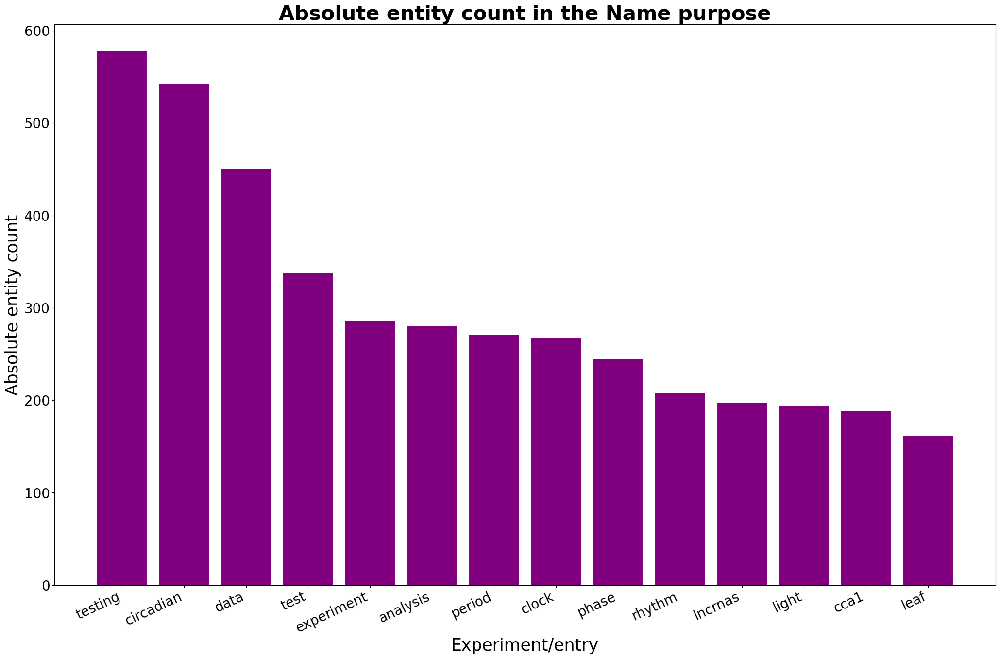

In [31]:
ax_name = plot_entity_counts(df_entities_name, "name", "purple", fig_size, 
                             "Absolute entity count in the Name purpose", fontsize_title, 
                             fontsize_labels, fontsize_ticks, rotation_ticks)

### Description

In [196]:
df_entities_description = df_all_entities_per_field(dfs, "description_entities_recognised", 200)
df_entities_description

,entity,count
11,days,1885
116,light,978
20,plants,670
167,\n,650
16,circadian,596
51,data,486
34,constant,426
84,day,391
33,seedlings,354
64,period,353


##### Removing '\n'

In [197]:
df_entities_description = df_entities_description.drop(167)
df_entities_description

,entity,count
11,days,1885
116,light,978
20,plants,670
16,circadian,596
51,data,486
34,constant,426
84,day,391
33,seedlings,354
64,period,353
155,cells,342


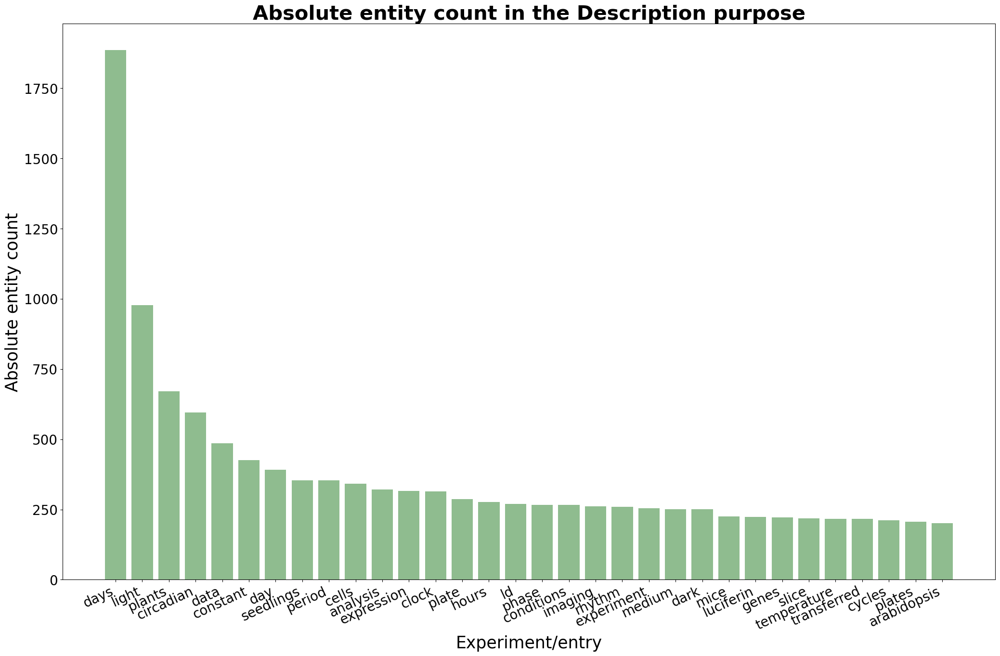

In [198]:
ax_description = plot_entity_counts(df_entities_description, "description", "darkseagreen", fig_size, 
                             "Absolute entity count in the Description purpose", fontsize_title, 
                             fontsize_labels, fontsize_ticks, rotation_ticks)

In [37]:
ax_description.get_figure().savefig('path')


### Comment

In [38]:
df_entities_comments = df_all_entities_per_field(dfs, "comments_entities_recognised", 100)
df_entities_comments

,entity,count
20,\n,455
0,circadian,345
95,data,280
92,conditions,262
3,period,201
1,rhythm,187
4,phase,180
169,analysis,161
10,growth,136
283,mice,132


##### Removing '\n'

In [39]:
df_entities_comments = df_entities_comments.drop(20)
df_entities_comments

,entity,count
0,circadian,345
95,data,280
92,conditions,262
3,period,201
1,rhythm,187
4,phase,180
169,analysis,161
10,growth,136
283,mice,132
2,inhibitors,130


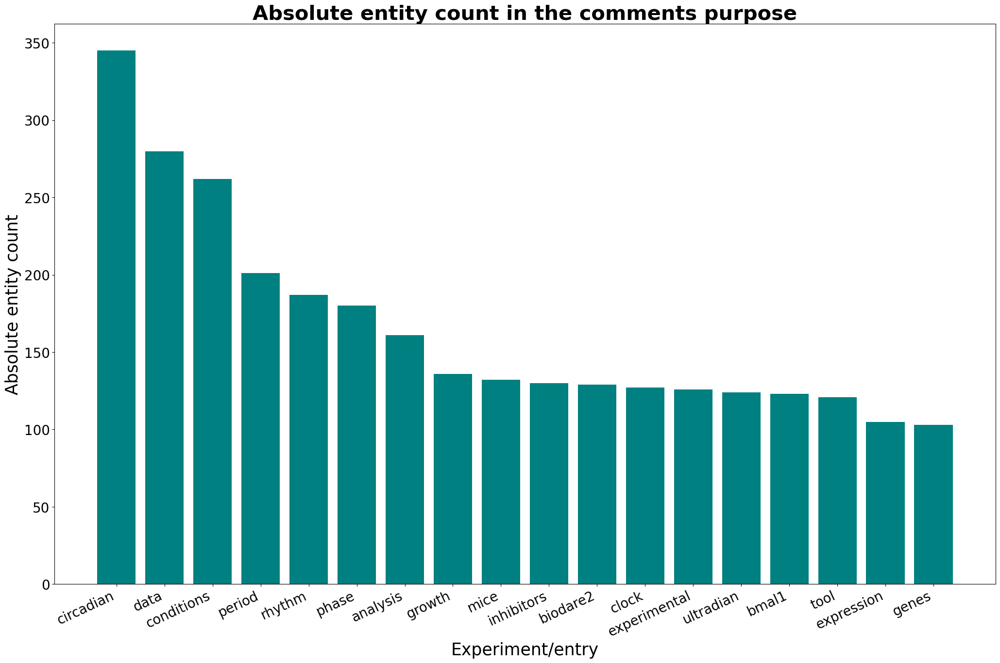

In [40]:
ax_comments = plot_entity_counts(df_entities_comments, "comments", "teal", fig_size, 
                             "Absolute entity count in the comments purpose", fontsize_title, 
                             fontsize_labels, fontsize_ticks, rotation_ticks)

In [41]:
ax_comments.get_figure().savefig('path')


### Purpose

In [42]:
df_entities_purpose = df_all_entities_per_field(dfs, "purpose_entities_recognised", 400)
df_entities_purpose

,entity,count
4,circadian,3336
27,period,1979
44,clock,1480
132,test,1397
67,data,1375
5,rhythm,1305
35,phase,1186
51,analysis,1162
14,effect,1038
25,expression,966


##### Removing '\n'

In [43]:
df_entities_purpose = df_entities_purpose.drop(176)
df_entities_purpose

,entity,count
4,circadian,3336
27,period,1979
44,clock,1480
132,test,1397
67,data,1375
5,rhythm,1305
35,phase,1186
51,analysis,1162
14,effect,1038
25,expression,966


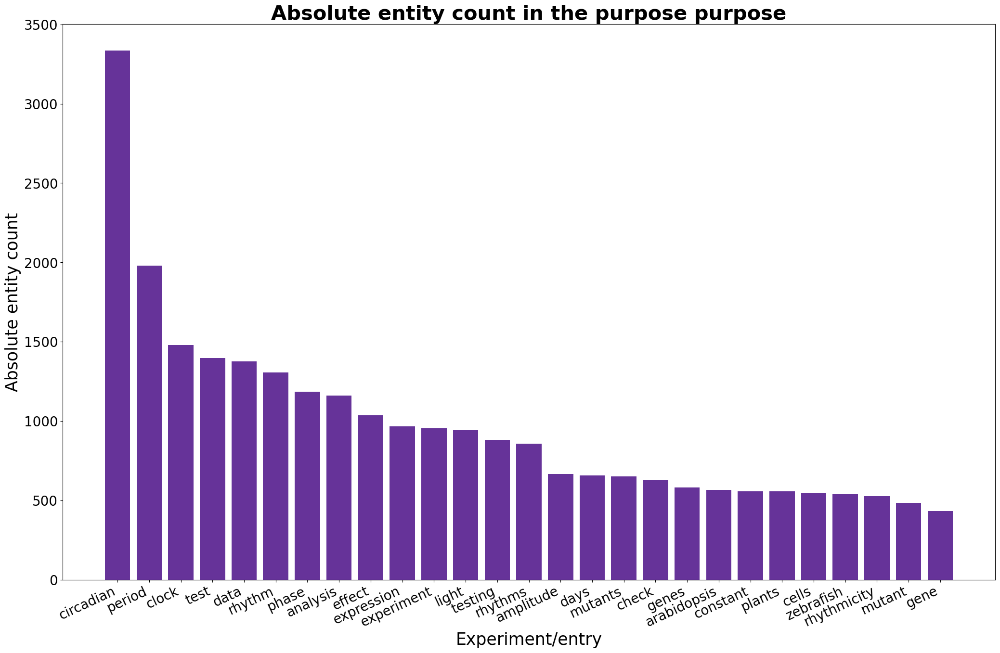

In [44]:
ax_purpose = plot_entity_counts(df_entities_purpose, "purpose", "rebeccapurple", fig_size, 
                             "Absolute entity count in the purpose purpose", fontsize_title, 
                             fontsize_labels, fontsize_ticks, rotation_ticks)

In [45]:
ax_purpose.get_figure().savefig('path')


### Several figures in one grid

#### Regular scale

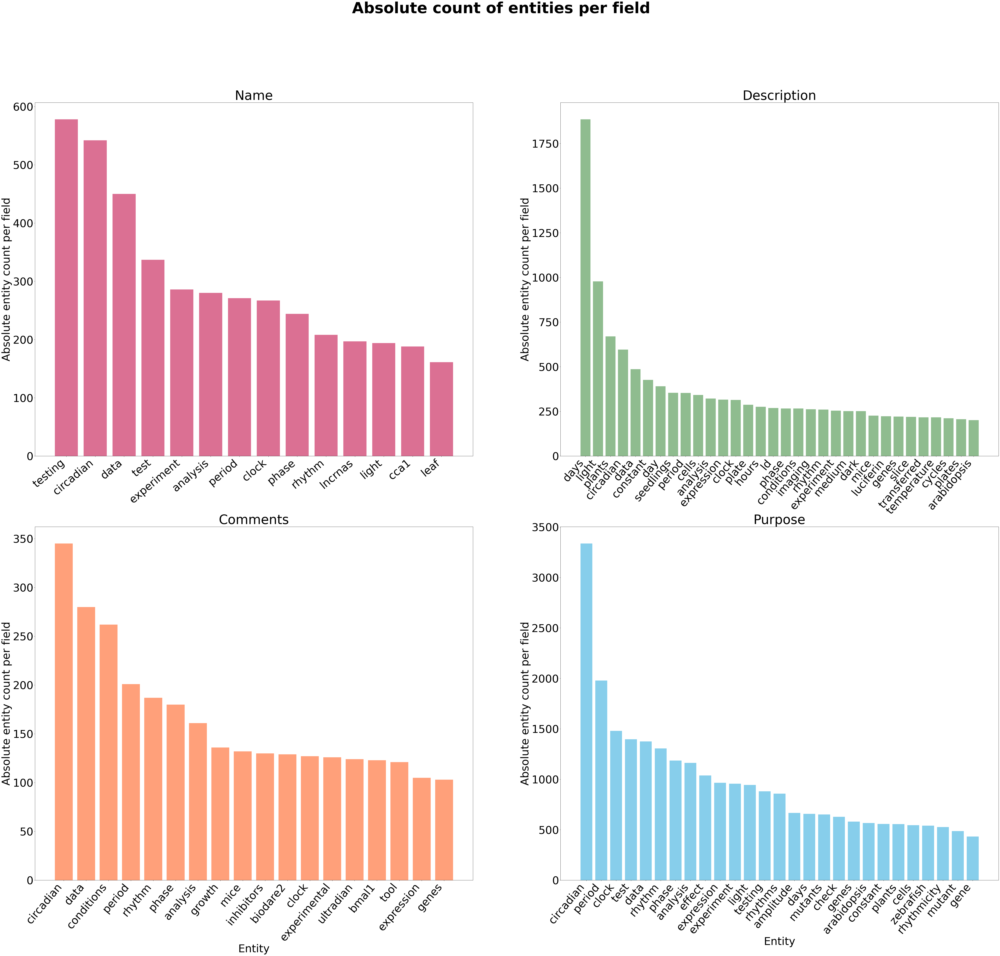

In [46]:
fig, ax = plt.subplots(2,2, figsize = (80,65))

fig.suptitle("Absolute count of entities per field", fontsize = 70, fontweight ='bold')

# Name
ax[0,0].bar(df_entities_name['entity'], df_entities_name['count'], color = "palevioletred")
ax[0,0].set_title("Name", fontsize = 60)
#ax[0,0].set_xlabel("Entity", fontsize = 50)
ax[0,0].set_xticks(df_entities_name['entity'])
ax[0,0].set_xticklabels(df_entities_name['entity'], fontsize = 50, rotation = 40, ha = "right")
ax[0,0].set_ylabel("Absolute entity count per field", fontsize = 50)
ax[0,0].tick_params(axis='both', which='major', labelsize = 50)

# Description
ax[0,1].bar(df_entities_description['entity'], df_entities_description['count'], color = "darkseagreen")
ax[0,1].set_title("Description", fontsize = 60)
#ax[0,1].set_xlabel("Entity", fontsize = 50)
ax[0,1].set_xticks(df_entities_description['entity'])
ax[0,1].set_xticklabels(df_entities_description['entity'], fontsize = 50, rotation = 50, ha = "right")
ax[0,1].set_ylabel("Absolute entity count per field", fontsize = 50)
ax[0,1].tick_params(axis='both', which='major', labelsize = 50)

# Comments
ax[1,0].bar(df_entities_comments['entity'], df_entities_comments['count'], color = "lightsalmon")
ax[1,0].set_title("Comments", fontsize = 60)
ax[1,0].set_xlabel("Entity", fontsize = 50)
ax[1,0].set_xticks(df_entities_comments['entity'])
ax[1,0].set_xticklabels(df_entities_comments['entity'], fontsize = 50, rotation = 50, ha = "right")
ax[1,0].set_ylabel("Absolute entity count per field", fontsize = 50)
ax[1,0].tick_params(axis='both', which='major', labelsize = 50)


# Purpose
ax[1,1].bar(df_entities_purpose['entity'], df_entities_purpose['count'], color = "skyblue")
ax[1,1].set_title("Purpose", fontsize = 60)
ax[1,1].set_xlabel("Entity", fontsize = 50)
ax[1,1].set_xticks(df_entities_purpose['entity'])
ax[1,1].set_xticklabels(df_entities_purpose['entity'], fontsize = 50, rotation = 50, ha = "right")
ax[1,1].set_ylabel("Absolute entity count per field", fontsize = 50)
ax[1,1].tick_params(axis='both', which='major', labelsize = 50)


plt.savefig('path')

#### Log scale

In [588]:
fig, ax = plt.subplots(2,2, figsize = (85,85))

fig.suptitle("Absolute count of entities per field", fontsize = 70, fontweight ='bold')

# Name
ax[0,0].bar(df_entities_name['entity'], df_entities_name['count'], color = "coral")
ax[0,0].set_title("Name", fontsize = 70, fontweight ='bold')
ax[0,0].set_xlabel("Entity", fontsize = 55)
ax[0,0].set_xticks(df_entities_name['entity'])
ax[0,0].set_xticklabels(df_entities_name['entity'], fontsize = 50, rotation = 50, ha = "right")
ax[0,0].set_ylabel("Experiment/entries", fontsize = 55)
ax[0,0].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[0,0].set_yscale('log')
ax[0,0].tick_params(axis='both', which='major', labelsize = 55)


# Purpose
ax[0,1].bar(df_entities_purpose['entity'], df_entities_purpose['count'], color = "palevioletred")
ax[0,1].set_title("Purpose", fontsize = 70, fontweight ='bold')
ax[0,1].set_xlabel("Entity", fontsize = 55)
ax[0,1].set_xticks(df_entities_purpose['entity'])
ax[0,1].set_xticklabels(df_entities_purpose['entity'], fontsize = 50, rotation = 50, ha = "right")
ax[0,1].set_ylabel("Experiment/entries", fontsize = 55)
ax[0,1].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[0,1].set_yscale('log')
ax[0,1].tick_params(axis='both', which='major', labelsize = 55)


# Comments
ax[1,0].bar(df_entities_comments['entity'], df_entities_comments['count'], color = "teal")
ax[1,0].set_title("Comments", fontsize = 70, fontweight ='bold')
ax[1,0].set_xlabel("Entity", fontsize = 55)
ax[1,0].set_xticks(df_entities_comments['entity'])
ax[1,0].set_xticklabels(df_entities_comments['entity'], fontsize = 50, rotation = 50, ha = "right")
ax[1,0].set_ylabel("Experiment/entries", fontsize = 55)
ax[1,0].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[1,0].set_yscale('log')
ax[1,0].tick_params(axis='both', which='major', labelsize = 55)


# Description
ax[1,1].bar(df_entities_description['entity'], df_entities_description['count'], color = "olive")
ax[1,1].set_title("Description", fontsize = 70, fontweight ='bold')
ax[1,1].set_xlabel("Entity", fontsize = 55)
ax[1,1].set_xticks(df_entities_description['entity'])
ax[1,1].set_xticklabels(df_entities_description['entity'], fontsize = 50, rotation = 50, ha = "right")
ax[1,1].set_ylabel("Experiment/entries", fontsize = 55)
ax[1,1].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[1,1].set_yscale('log')
ax[1,1].tick_params(axis='both', which='major', labelsize = 55)


plt.savefig('path')

## Analysis

### By species

In [199]:
dfs[0]["species"]

0    Arabidopsis thaliana
Name: species, dtype: object

In [200]:
def df_all_elements_in_field(dfs, header, comparison, threshold):
    count = 0
    species_list = []
    
    while count < len(dfs):
        species_in_field = dfs[count][header][0]
        species_list.append(species_in_field)
        
        #list_of_strings = [item for sublist in species_list for item in sublist]
        element_counter = dict(Counter(species_list))
        df_counts = pd.DataFrame(element_counter.items(), columns = [comparison, 'count'])
        df_counts_sorted = df_counts.sort_values(by = ['count'], ascending = False)
        df_counts_sorted_filtered = df_counts_sorted[df_counts_sorted['count'] > threshold]
        
        count += 1
    
    return df_counts_sorted_filtered

In [201]:
df_all_species = df_all_elements_in_field(dfs,"species","species",0)

In [202]:
df_all_species

,species,count
0,Arabidopsis thaliana,5728
3,Mus musculus,2708
4,Danio rerio,1428
1,Homo sapiens,1328
2,Neurospora crassa,1022
7,Synthetic data,951
9,Synechococcus elongatus,539
5,Drosophila melanogaster,523
18,Medicago truncatula,239
11,Phaeodactylum tricornutum,155


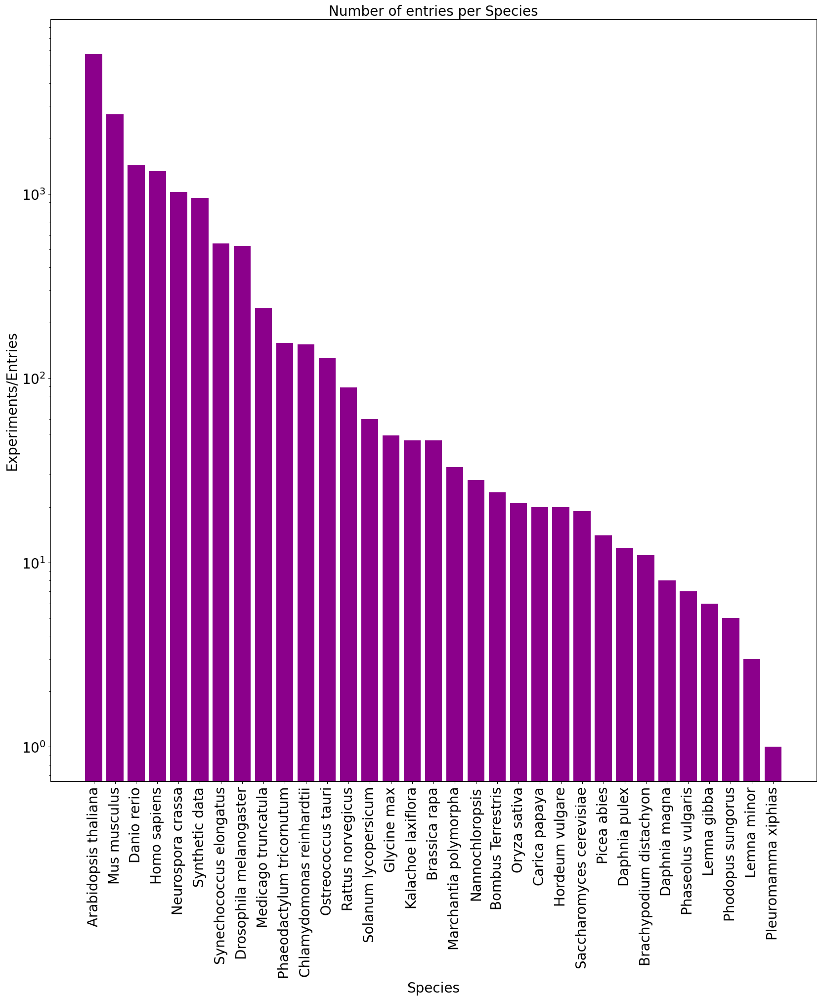

In [205]:
fig = plt.figure(figsize=(20,20))
plt.bar(df_all_species['species'], df_all_species['count'], color = "darkmagenta")
plt.title('Number of entries per Species', fontsize = 20)
plt.xlabel('Species', fontsize = 20)
plt.ylabel('Experiments/Entries', fontsize = 20)
plt.yticks(fontsize = 20)
plt.xticks(fontsize = 20, rotation = 90)
plt.yscale('log')
plt.show()

### Number of words

#### Name

In [207]:
df_number_words_name_sorted = df_all_elements_in_field(dfs,"name_count_words", "number_of_words",0)
df_number_words_name_sorted

,number_of_words,count
0,1,3834
6,3,2071
1,4,2029
5,2,1886
2,5,1511
4,6,1129
12,7,863
3,8,577
7,9,438
8,10,294


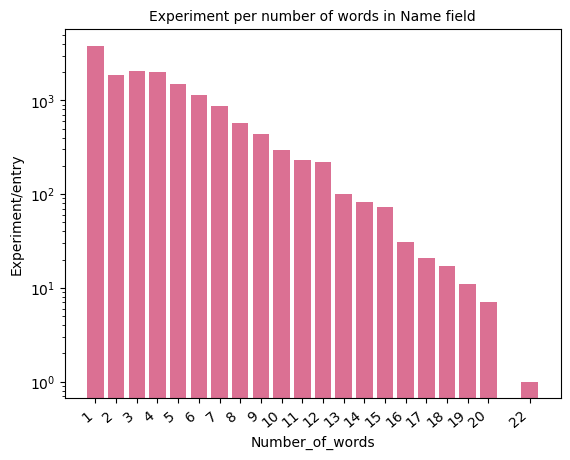

In [208]:
plt.bar(df_number_words_name_sorted['number_of_words'], df_number_words_name_sorted['count'], color = "palevioletred")
plt.title("Experiment per number of words in Name field", fontsize = 10)
plt.xlabel("Number_of_words", fontsize = 10)
plt.xticks(df_number_words_name_sorted['number_of_words'],fontsize = 10, rotation = 40, ha = "right")
plt.yscale('log')

plt.ylabel("Experiment/entry", fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize = 10)

#### Purpose

In [209]:
df_number_words_purpose_sorted = df_all_elements_in_field(dfs,"purpose_count_words", "number_of_words", 0)
df_number_words_purpose_sorted

,number_of_words,count
1,11,1847
7,10,1828
5,12,1595
3,13,1399
4,9,1288
...,...,...
140,203,1
141,208,1
143,197,1
145,207,1


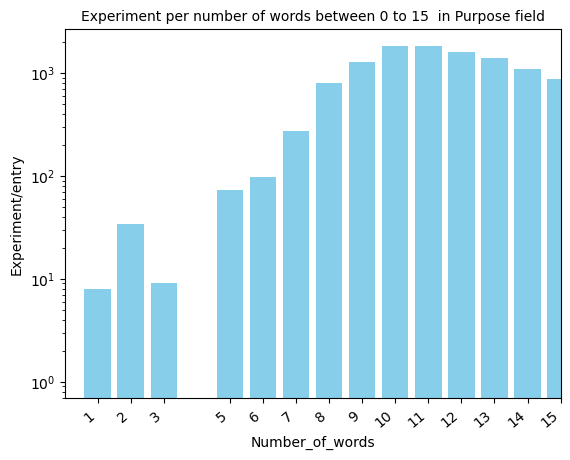

In [210]:
plt.bar(df_number_words_purpose_sorted['number_of_words'], df_number_words_purpose_sorted['count'], color = "skyblue")
plt.title("Experiment per number of words between 0 to 15  in Purpose field", fontsize = 10)
plt.xlabel("Number_of_words", fontsize = 10)
plt.xticks(df_number_words_purpose_sorted['number_of_words'],fontsize = 10, rotation = 40, ha = "right")
plt.xlim(0,15)
plt.yscale('log')

plt.ylabel("Experiment/entry", fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize = 10)

In [211]:
df_number_words_purpose_sorted_100 = df_all_elements_in_field(dfs,"purpose_count_words", "number_of_words", 100)
df_number_words_purpose_sorted_100

,number_of_words,count
1,11,1847
7,10,1828
5,12,1595
3,13,1399
4,9,1288
2,14,1106
9,15,867
13,8,799
10,16,653
0,17,585


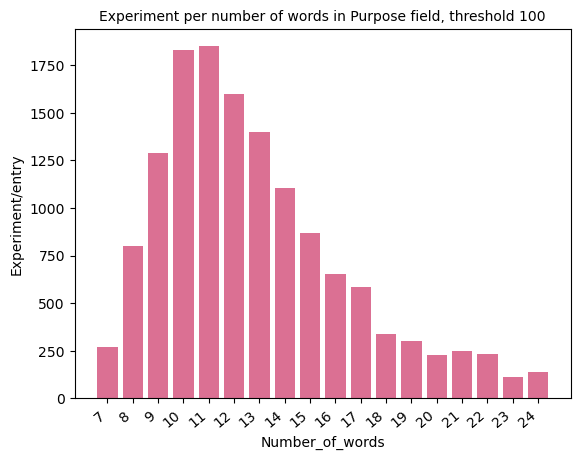

In [212]:
plt.bar(df_number_words_purpose_sorted_100['number_of_words'], df_number_words_purpose_sorted_100['count'], color = "palevioletred")
plt.title("Experiment per number of words in Purpose field, threshold 100", fontsize = 10)
plt.xlabel("Number_of_words", fontsize = 10)
plt.xticks(df_number_words_purpose_sorted_100['number_of_words'],fontsize = 10, rotation = 40, ha = "right")

plt.ylabel("Experiment/entry", fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize = 10)

#### Description

In [213]:
df_number_words_description_sorted = df_all_elements_in_field(dfs,"description_count_words", "number_of_words", 0)
df_number_words_description_sorted

,number_of_words,count
0,0,10184
8,10,297
7,8,246
13,13,245
6,9,209
...,...,...
139,147,1
146,193,1
147,277,1
148,176,1


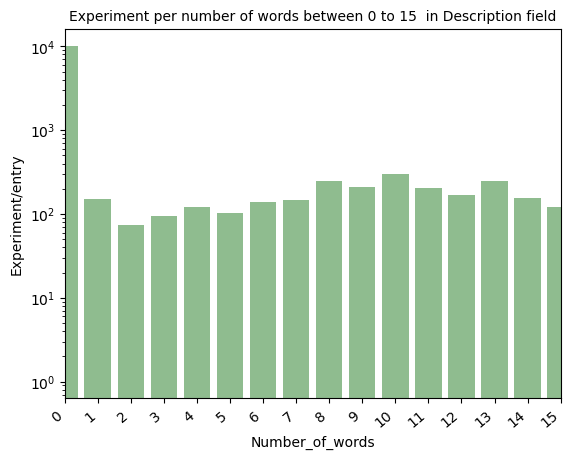

In [214]:
plt.bar(df_number_words_description_sorted['number_of_words'], df_number_words_description_sorted['count'], color = "darkseagreen")
plt.title("Experiment per number of words between 0 to 15  in Description field", fontsize = 10)
plt.xlabel("Number_of_words", fontsize = 10)
plt.xticks(df_number_words_description_sorted['number_of_words'],fontsize = 10, rotation = 40, ha = "right")
plt.xlim(0,15)
plt.yscale('log')

plt.ylabel("Experiment/entry", fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize = 10)

In [215]:
df_number_words_description_sorted_70 = df_all_elements_in_field(dfs,"description_count_words", "number_of_words", 70)
df_number_words_description_sorted_70

,number_of_words,count
0,0,10184
8,10,297
7,8,246
13,13,245
6,9,209
27,11,204
9,12,170
28,14,156
3,1,152
5,7,146


#### Comments

In [216]:
df_number_words_comments_sorted = df_all_elements_in_field(dfs,"comments_count_words", "number_of_words", 0)
df_number_words_comments_sorted

,number_of_words,count
0,0,13813
27,1,226
1,10,164
14,8,139
12,12,61
...,...,...
102,76,1
13,189,1
107,174,1
108,222,1


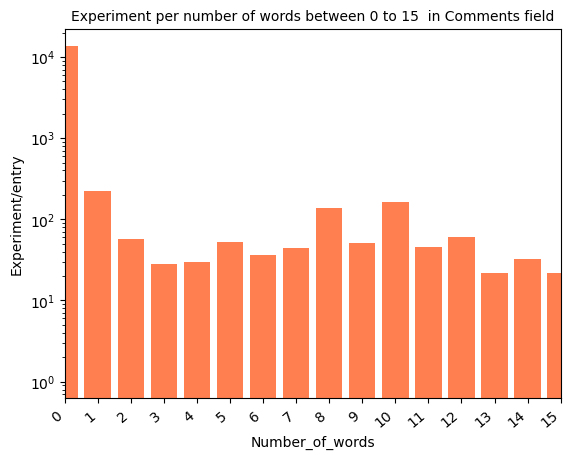

In [217]:
plt.bar(df_number_words_comments_sorted['number_of_words'], df_number_words_comments_sorted['count'], color = "coral")
plt.title("Experiment per number of words between 0 to 15  in Comments field", fontsize = 10)
plt.xlabel("Number_of_words", fontsize = 10)
plt.xticks(df_number_words_comments_sorted['number_of_words'],fontsize = 10, rotation = 40, ha = "right")
plt.xlim(0,15)
plt.yscale('log')

plt.ylabel("Experiment/entry", fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize = 10)

In [218]:
df_number_words_comments_sorted_30 = df_all_elements_in_field(dfs,"comments_count_words", "number_of_words", 30)
df_number_words_comments_sorted_30_by_words = df_number_words_comments_sorted.sort_values(by='number_of_words')
df_number_words_comments_sorted_30_by_words

,number_of_words,count
0,0,13813
27,1,226
10,2,58
29,3,28
30,4,30
...,...,...
106,257,4
48,259,1
100,277,1
117,298,1


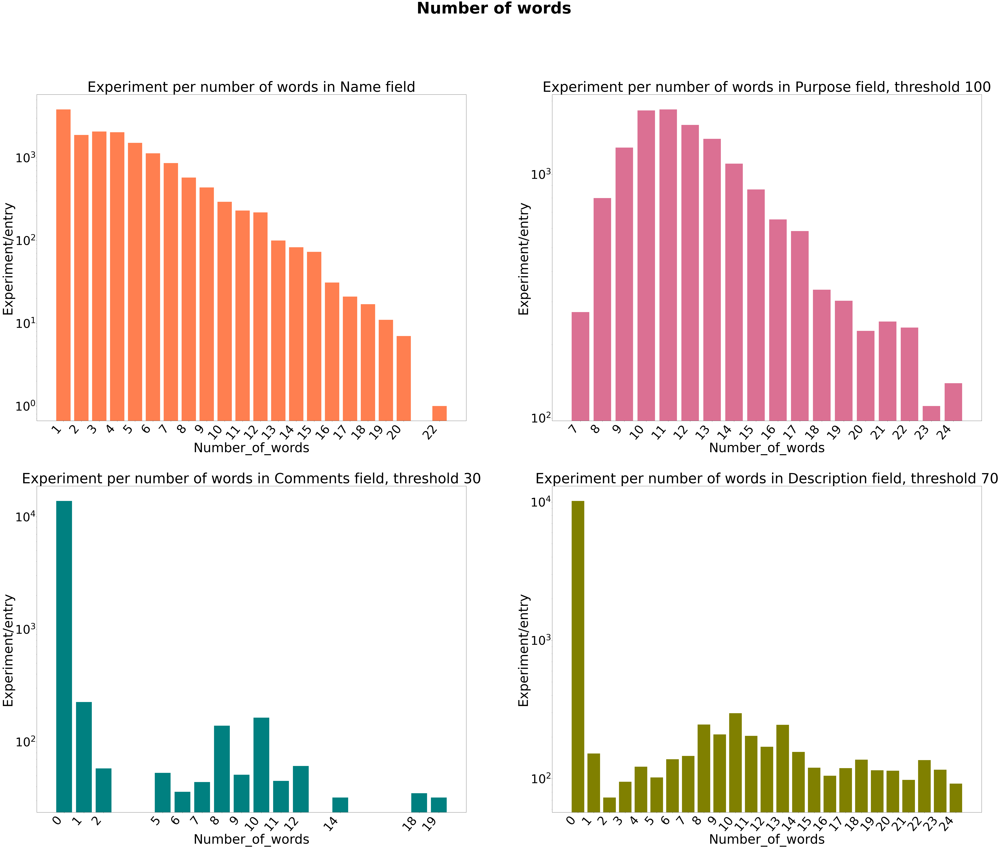

In [223]:
fig, ax = plt.subplots(2,2, figsize = (85,65))

fig.suptitle("Number of words", fontsize = 80, fontweight ='bold')

## Name
ax[0,0].bar(df_number_words_name_sorted['number_of_words'], df_number_words_name_sorted['count'], color = "coral")
ax[0,0].set_title("Experiment per number of words in Name field", fontsize = 70)
ax[0,0].set_xlabel("Number_of_words", fontsize = 65)
ax[0,0].set_xticks(df_number_words_name_sorted['number_of_words'])
ax[0,0].set_xticklabels(df_number_words_name_sorted['number_of_words'],fontsize = 60, rotation = 50, ha = "right")
ax[0,0].set_ylabel("Experiment/entry", fontsize = 65)
ax[0,0].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[0,0].set_yscale('log')
ax[0,0].tick_params(axis='both', which='major', labelsize = 60)

## Purpose
ax[0,1].bar(df_number_words_purpose_sorted_100['number_of_words'], df_number_words_purpose_sorted_100['count'], color = "palevioletred")
ax[0,1].set_title("Experiment per number of words in Purpose field, threshold 100", fontsize = 70)
ax[0,1].set_xlabel("Number_of_words", fontsize = 65)
ax[0,1].set_xticks(df_number_words_purpose_sorted_100['number_of_words'])
ax[0,1].set_xticklabels(df_number_words_purpose_sorted_100['number_of_words'], fontsize = 60, rotation = 50, ha = "right")
ax[0,1].set_ylabel("Experiment/entry", fontsize = 65)
ax[0,1].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[0,1].set_yscale('log')
ax[0,1].tick_params(axis='both', which='major', labelsize = 60)


## Comments
ax[1,0].bar(df_number_words_comments_sorted_30['number_of_words'], df_number_words_comments_sorted_30['count'], color = "teal")
ax[1,0].set_title("Experiment per number of words in Comments field, threshold 30", fontsize = 70)
ax[1,0].set_xlabel("Number_of_words", fontsize = 65)
ax[1,0].set_xticks(df_number_words_comments_sorted_30['number_of_words'])
ax[1,0].set_xticklabels(df_number_words_comments_sorted_30['number_of_words'], fontsize = 60, rotation = 50, ha = "right")
ax[1,0].set_ylabel("Experiment/entry", fontsize = 65)
ax[1,0].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[1,0].set_yscale('log')
ax[1,0].tick_params(axis='both', which='major', labelsize = 60)


## Description
ax[1,1].bar(df_number_words_description_sorted_70['number_of_words'], df_number_words_description_sorted_70['count'], color = "olive")
ax[1,1].set_title("Experiment per number of words in Description field, threshold 70", fontsize = 70)
ax[1,1].set_xlabel("Number_of_words", fontsize = 65)
ax[1,1].set_xticks(df_number_words_description_sorted_70['number_of_words'])
ax[1,1].set_xticklabels(df_number_words_description_sorted_70['number_of_words'], fontsize = 60, rotation = 50, ha = "right")
ax[1,1].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[1,1].set_ylabel("Experiment/entry", fontsize = 65)
ax[1,1].set_yscale('log')
ax[1,1].tick_params(axis='both', which='major', labelsize = 60)


plt.savefig('path')

## Analysis per BioDare version

#### Creating two new list with BioDare2 version entries

In [373]:
list_biodare_1 = []
list_biodare_2 = []
count = 0

while count < len(dfs):
    wk_df = dfs[count]
    id_df = wk_df["id_experiment"][0]
    
    if id_df >= 100000000:
        list_biodare_1.append(wk_df)
    else:
        list_biodare_2.append(wk_df)
        
    count += 1

In [374]:
len(dfs)

15424

In [375]:
len(list_biodare_1)

105

In [236]:
len(list_biodare_2)

15319

### Species

In [237]:
df_all_species_biodare_1 = df_all_elements_in_field(list_biodare_1,"species","species",0)
df_all_species_biodare_1 

,species,count
0,Arabidopsis thaliana,103
1,Neurospora crassa,1
2,Ostreococcus tauri,1


In [238]:
df_all_species_biodare_2 = df_all_elements_in_field(list_biodare_2,"species","species",0)
df_all_species_biodare_2

,species,count
0,Arabidopsis thaliana,5625
3,Mus musculus,2708
4,Danio rerio,1428
1,Homo sapiens,1328
2,Neurospora crassa,1021
7,Synthetic data,951
9,Synechococcus elongatus,539
5,Drosophila melanogaster,523
18,Medicago truncatula,239
11,Phaeodactylum tricornutum,155


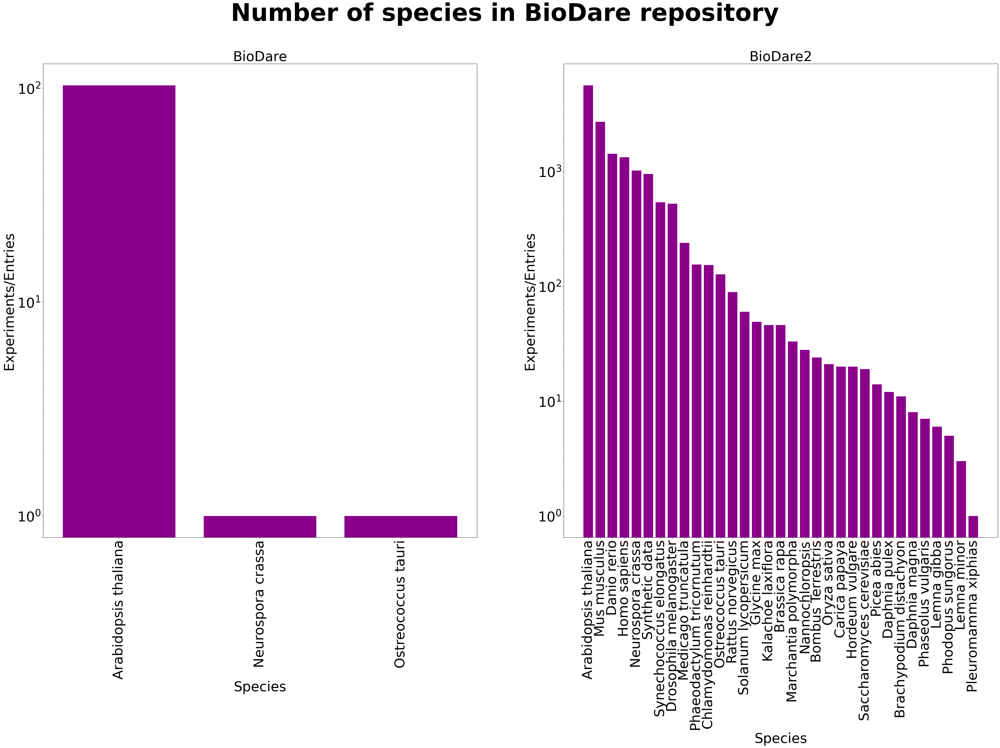

In [239]:
fig, ax = plt.subplots(1,2, figsize = (50,25))

fig.suptitle("Number of species in BioDare repository", fontsize = 70, fontweight ='bold')

# BioDare1
ax[0].bar(df_all_species_biodare_1['species'], df_all_species_biodare_1['count'], color = "darkmagenta")
ax[0].set_title('BioDare', fontsize = 40)
ax[0].set_xlabel('Species', fontsize = 40)
ax[0].set_ylabel('Experiments/Entries', fontsize = 40)


ax[0].set_xticks(df_all_species_biodare_1['species'])
ax[0].set_xticklabels(df_all_species_biodare_1['species'],fontsize = 40, rotation = 90)

ax[0].set_yticks(df_all_species_biodare_1['count'])
ax[0].set_yticklabels(df_all_species_biodare_1['count'],fontsize = 40)
ax[0].set_yscale('log')

# BioDare2
ax[1].bar(df_all_species_biodare_2['species'], df_all_species_biodare_2['count'], color = "darkmagenta")
ax[1].set_title('BioDare2', fontsize = 40)
ax[1].set_xlabel('Species', fontsize = 40)
ax[1].set_ylabel('Experiments/Entries', fontsize = 40)

ax[1].set_xticks(df_all_species_biodare_2['species'])
ax[1].set_xticklabels(df_all_species_biodare_2['species'],fontsize = 40, rotation = 90)

ax[1].set_yticks(df_all_species_biodare_1['count'])
ax[1].set_yticklabels(df_all_species_biodare_1['count'],fontsize = 40)
ax[1].set_yscale('log')

plt.savefig('path')

### Entities

#### BioDare

In [240]:
df_entities_name_bd1 = df_all_entities_per_field(list_biodare_1, "name_entities_recognised", 5)
df_entities_name_bd1

,entity,count
26,4x,10
14,rl-cryptochrome,10
1,paper-rep1,9
0,bl-cryptochrome,9
2,rbl-cryptochrome,9
37,llx3,7
3,paper-rep2,6


In [589]:
df_entities_purpose_bd1 = df_all_entities_per_field(list_biodare_1, "purpose_entities_recognised", 0)
df_entities_purpose_bd1 

,entity,count
12,clock,38
1,mutants,35
0,temperature-comp-photoreceptor,30
15,mutant,28
18,photoperiod,26
...,...,...
82,effects,1
81,plate-position,1
78,protein,1
77,+,1


In [242]:
df_entities_description_bd1 = df_all_entities_per_field(list_biodare_1, "description_entities_recognised", 20)
df_entities_description_bd1

,entity,count
16,light,37
18,days,36
15,white,31
1,sucrose,23


In [243]:
df_entities_comments_bd1 = df_all_entities_per_field(list_biodare_1, "comments_entities_recognised", 30)
df_entities_comments_bd1

,entity,count
3,conditions,219
4,experimental,111
2,growth,110
1,\n,66
0,null,65


In [244]:
df_entities_comments_bd1 = df_entities_comments_bd1.drop(1)
df_entities_comments_bd1

,entity,count
3,conditions,219
4,experimental,111
2,growth,110
0,null,65


#### BioDare 2

##### Name

In [246]:
df_entities_name_bd2 = df_all_entities_per_field(list_biodare_2, "name_entities_recognised", 0)
df_entities_name_bd2

,entity,count
101,testing,578
10,circadian,542
152,data,450
31,test,337
89,experiment,286
...,...,...
3850,inact,1
3849,vw044_w,1
3847,env1_exp13,1
3845,total-per3-dd,1


In [276]:
df_entities_name_bd2_200 = df_all_entities_per_field(list_biodare_2, "name_entities_recognised", 200)
df_entities_name_bd2_200

,entity,count
101,testing,578
10,circadian,542
152,data,450
31,test,337
89,experiment,286
137,analysis,279
102,period,271
26,clock,263
72,phase,244
11,rhythm,208


###### Purpose

In [247]:
df_entities_purpose_bd2 = df_all_entities_per_field(list_biodare_2, "purpose_entities_recognised", 0)
df_entities_purpose_bd2

,entity,count
4,circadian,3322
27,period,1979
44,clock,1442
132,test,1389
67,data,1374
...,...,...
7470,https://pfam.xfam.org/,1
7469,pfam,1
7466,reviewers,1
7463,clonend,1


In [252]:
df_entities_purpose_bd2["entity"][176]

'\n'

In [253]:
df_entities_purpose_bd2 = df_entities_purpose_bd2.drop(176)
df_entities_purpose_bd2

,entity,count
4,circadian,3322
27,period,1979
44,clock,1442
132,test,1389
67,data,1374
...,...,...
7470,https://pfam.xfam.org/,1
7469,pfam,1
7466,reviewers,1
7463,clonend,1


In [280]:
df_entities_purpose_bd2_500 = df_all_entities_per_field(list_biodare_2, "purpose_entities_recognised", 500)
df_entities_purpose_bd2_500

,entity,count
4,circadian,3322
27,period,1979
44,clock,1442
132,test,1389
67,data,1374
5,rhythm,1305
35,phase,1168
51,analysis,1157
14,effect,1030
25,expression,965


In [285]:
df_entities_purpose_bd2_500 = df_entities_purpose_bd2_500.drop(176)
df_entities_purpose_bd2_500

,entity,count
4,circadian,3322
27,period,1979
44,clock,1442
132,test,1389
67,data,1374
5,rhythm,1305
35,phase,1168
51,analysis,1157
14,effect,1030
25,expression,965


##### Description

In [258]:
df_entities_description_bd2 = df_all_entities_per_field(list_biodare_2, "description_entities_recognised", 0)
df_entities_description_bd2

,entity,count
11,days,1849
116,light,941
20,plants,651
167,\n,641
16,circadian,581
...,...,...
4801,hydrogels,1
2072,repoter,1
4803,editor,1
4804,mail,1


In [261]:
df_entities_description_bd2 = df_entities_description_bd2.drop(167)
df_entities_description_bd2

,entity,count
11,days,1849
116,light,941
20,plants,651
16,circadian,581
51,data,476
...,...,...
4801,hydrogels,1
2072,repoter,1
4803,editor,1
4804,mail,1


In [262]:
df_entities_description_bd2_300 = df_all_entities_per_field(list_biodare_2, "description_entities_recognised", 300)
df_entities_description_bd2_300

,entity,count
11,days,1849
116,light,941
20,plants,651
167,\n,641
16,circadian,581
51,data,476
34,constant,410
84,day,378
64,period,350
155,cells,342


In [265]:
df_entities_description_bd2_300 = df_entities_description_bd2_300.drop(167)
df_entities_description_bd2_300

,entity,count
11,days,1849
116,light,941
20,plants,651
16,circadian,581
51,data,476
34,constant,410
84,day,378
64,period,350
155,cells,342
33,seedlings,341


##### Comments

In [266]:
df_entities_comments_bd2 = df_all_entities_per_field(list_biodare_2, "comments_entities_recognised", 0)
df_entities_comments_bd2

,entity,count
20,\n,389
0,circadian,345
92,data,263
3,period,201
1,rhythm,187
...,...,...
2128,mail,1
2127,editor,1
2126,browser,1
2125,interfering,1


In [267]:
df_entities_comments_bd2 = df_entities_comments_bd2.drop(20)
df_entities_comments_bd2

,entity,count
0,circadian,345
92,data,263
3,period,201
1,rhythm,187
4,phase,179
...,...,...
2128,mail,1
2127,editor,1
2126,browser,1
2125,interfering,1


In [268]:
df_entities_comments_bd2_100 = df_all_entities_per_field(list_biodare_2, "comments_entities_recognised", 100)
df_entities_comments_bd2_100

,entity,count
20,\n,389
0,circadian,345
92,data,263
3,period,201
1,rhythm,187
4,phase,179
166,analysis,158
280,mice,132
2,inhibitors,130
165,biodare2,129


In [269]:
df_entities_comments_bd2_100 = df_entities_comments_bd2_100.drop(20)
df_entities_comments_bd2_100

,entity,count
0,circadian,345
92,data,263
3,period,201
1,rhythm,187
4,phase,179
166,analysis,158
280,mice,132
2,inhibitors,130
165,biodare2,129
98,clock,126


### Graph

In [270]:
fig_size = (25,15)
fontsize_title = 30
fontsize_labels = 25
fontsize_ticks = 20
rotation_ticks = 25

#### Name

In [277]:
df_entities_name_bd2_200

,entity,count
101,testing,578
10,circadian,542
152,data,450
31,test,337
89,experiment,286
137,analysis,279
102,period,271
26,clock,263
72,phase,244
11,rhythm,208


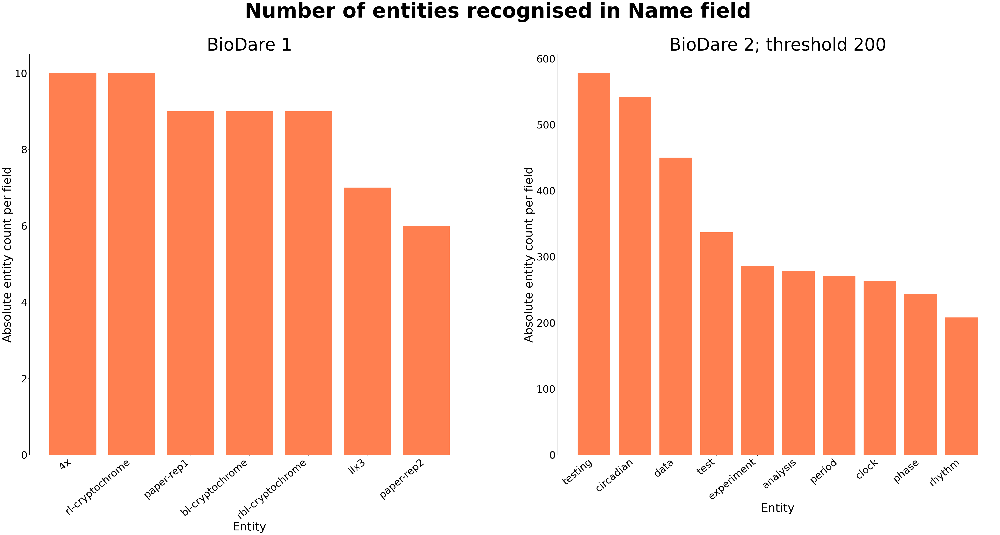

In [300]:
fig, ax = plt.subplots(1,2, figsize = (60,25))

fig.suptitle("Number of entities recognised in Name field", fontsize = 70, fontweight ='bold')

# BioDare1
ax[0].bar(df_entities_name_bd1['entity'], df_entities_name_bd1['count'], color = "coral")
ax[0].set_title("BioDare 1", fontsize = 60)
ax[0].set_xlabel("Entity", fontsize = 40)
ax[0].set_xticks(df_entities_name_bd1['entity'])
ax[0].set_xticklabels(df_entities_name_bd1['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[0].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[0].tick_params(axis='both', which='major', labelsize = 35)

# BioDare2
ax[1].bar(df_entities_name_bd2_200['entity'], df_entities_name_bd2_200['count'], color = "coral")
ax[1].set_title("BioDare 2; threshold 200", fontsize = 60)
ax[1].set_xlabel("Entity", fontsize = 40)
ax[1].set_xticks(df_entities_name_bd2_200['entity'])
ax[1].set_xticklabels(df_entities_name_bd2_200['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[1].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[1].tick_params(axis='both', which='major', labelsize = 35)

plt.savefig('path')



#### Purpose

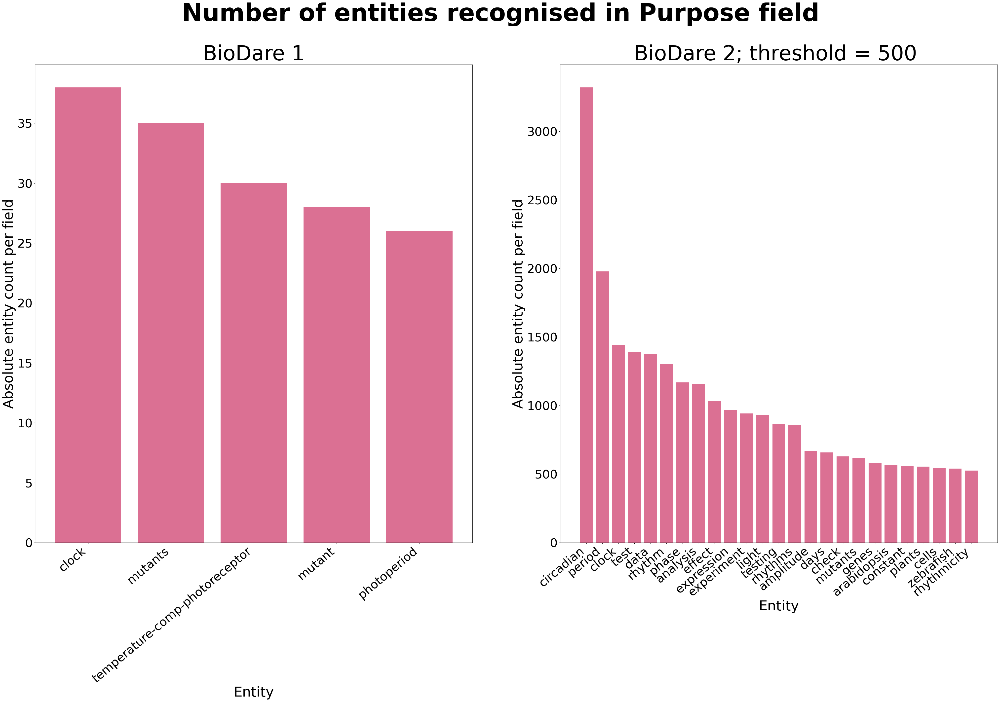

In [301]:
fig, ax = plt.subplots(1,2, figsize = (50,25))

fig.suptitle("Number of entities recognised in Purpose field", fontsize = 70, fontweight ='bold')

# BioDare1
ax[0].bar(df_entities_purpose_bd1['entity'], df_entities_purpose_bd1['count'], color = "palevioletred")
ax[0].set_title("BioDare 1", fontsize = 60)
ax[0].set_xlabel("Entity", fontsize = 40)
ax[0].set_xticks(df_entities_purpose_bd1['entity'])
ax[0].set_xticklabels(df_entities_purpose_bd1['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[0].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[0].tick_params(axis='both', which='major', labelsize = 35)

# BioDare2
ax[1].bar(df_entities_purpose_bd2_500['entity'], df_entities_purpose_bd2_500['count'], color = "palevioletred")
ax[1].set_title("BioDare 2; threshold = 500 ", fontsize = 60)
ax[1].set_xlabel("Entity", fontsize = 40)
ax[1].set_xticks(df_entities_purpose_bd2_500['entity'])
ax[1].set_xticklabels(df_entities_purpose_bd2_500['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[1].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[1].tick_params(axis='both', which='major', labelsize = 35)

plt.savefig('/Users/s2531396/Library/CloudStorage/OneDrive-UniversityofEdinburgh/PhD/Code/Graph/entities_purpose_biodare_vs_biodare2.pdf')



In [ ]:
ax_purpose_bd1 = plot_entity_counts(df_entities_purpose_bd1, "purpose", "powderblue", fig_size, 
                             "Absolute entity count in the comments purpose in BioDare", fontsize_title, 
                             fontsize_labels, fontsize_ticks, rotation_ticks)

#### Description

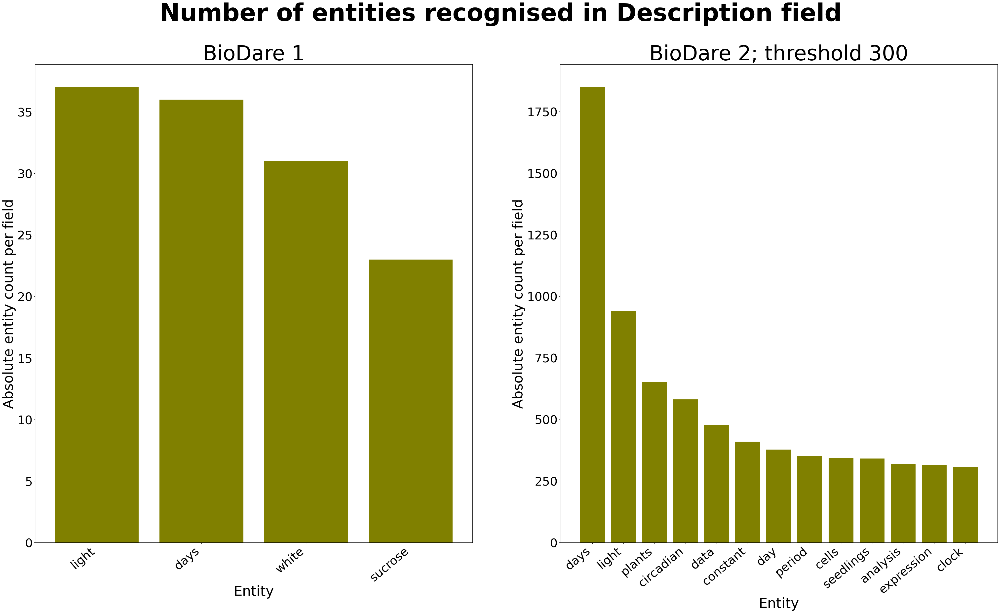

In [302]:
fig, ax = plt.subplots(1,2, figsize = (50,25))

fig.suptitle("Number of entities recognised in Description field", fontsize = 70, fontweight ='bold')

# BioDare1
ax[0].bar(df_entities_description_bd1['entity'], df_entities_description_bd1['count'], color = "olive")
ax[0].set_title("BioDare 1", fontsize = 60)
ax[0].set_xlabel("Entity", fontsize = 40)
ax[0].set_xticks(df_entities_description_bd1['entity'])
ax[0].set_xticklabels(df_entities_description_bd1['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[0].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[0].tick_params(axis='both', which='major', labelsize = 35)

# BioDare2
ax[1].bar(df_entities_description_bd2_300['entity'], df_entities_description_bd2_300['count'], color = "olive")
ax[1].set_title("BioDare 2; threshold 300", fontsize = 60)
ax[1].set_xlabel("Entity", fontsize = 40)
ax[1].set_xticks(df_entities_description_bd2_300['entity'])
ax[1].set_xticklabels(df_entities_description_bd2_300['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[1].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[1].tick_params(axis='both', which='major', labelsize = 35)


plt.savefig('path')


#### Comments

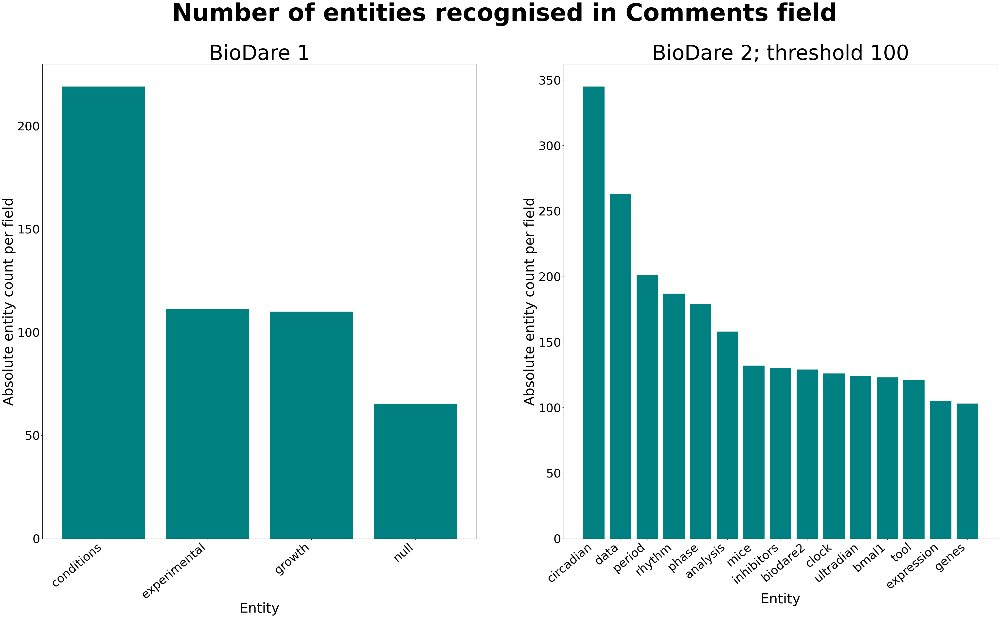

In [304]:
fig, ax = plt.subplots(1,2, figsize = (50,25))

fig.suptitle("Number of entities recognised in Comments field", fontsize = 70, fontweight ='bold')

# BioDare1
ax[0].bar(df_entities_comments_bd1['entity'], df_entities_comments_bd1['count'], color = "teal")
ax[0].set_title("BioDare 1", fontsize = 60)
ax[0].set_xlabel("Entity", fontsize = 40)
ax[0].set_xticks(df_entities_comments_bd1['entity'])
ax[0].set_xticklabels(df_entities_comments_bd1['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[0].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[0].tick_params(axis='both', which='major', labelsize = 35)

# BioDare2
ax[1].bar(df_entities_comments_bd2_100['entity'], df_entities_comments_bd2_100['count'], color = "teal")
ax[1].set_title("BioDare 2; threshold 100", fontsize = 60)
ax[1].set_xlabel("Entity", fontsize = 40)
ax[1].set_xticks(df_entities_comments_bd2_100['entity'])
ax[1].set_xticklabels(df_entities_comments_bd2_100['entity'], fontsize = 30, rotation = 40, ha = "right")
ax[1].set_ylabel("Absolute entity count per field", fontsize = 40)
ax[1].tick_params(axis='both', which='major', labelsize = 35)

plt.savefig('path')


## Analysis per species

In [79]:
list_arabidopsis = []
list_mus = []
list_danio = []
list_homo = []
list_neurospora = []
list_synthetic = []
list_synechococcus = []
list_drosophila = []
count = 0

while count < len(dfs):
    wk_df = dfs[count]
    specie_df = wk_df["species"][0]
    
    if specie_df == 'Arabidopsis thaliana':
        list_arabidopsis.append(wk_df)
        
    elif specie_df == 'Mus musculus':
        list_mus.append(wk_df)
        
    elif specie_df == 'Danio rerio':
        list_danio.append(wk_df)
        
    elif specie_df == 'Homo sapiens':
        list_homo.append(wk_df)
        
    elif specie_df == 'Neurospora crassa':
        list_neurospora.append(wk_df)
        
    elif specie_df == 'Synthetic data':
        list_synthetic.append(wk_df)
        
    elif specie_df == 'Synechococcus elongatus':
        list_synechococcus.append(wk_df)
        
    elif specie_df == 'Drosophila melanogaster':
        list_drosophila.append(wk_df)
        
    count += 1

#### Drosophila

In [80]:
list_drosophila[0].columns

Index(['name', 'purpose', 'description', 'comments', 'id', 'login',
       'firstName', 'lastName', 'institution_name', 'logName', 'executionDate',
       'measurementDesc.technique', 'measurementDesc.equipment',
       'measurementDesc.description', 'measurementDesc.parameters',
       'hasAttachments', 'hasTSData', 'hasPPAJobs', 'hasDataFiles',
       'attachmentsSize', 'biodare1Id', 'isOpenAccess', 'dataCategories',
       'species', 'created', 'modified', 'modifiedBy', 'dataCategory',
       'id_experiment', 'name_count_words', 'name_count_characters',
       'name_entities_recognised', 'purpose_count_words',
       'purpose_count_characters', 'purpose_entities_recognised',
       'description_count_words', 'description_count_characters',
       'description_entities_recognised', 'comments_count_words',
       'comments_count_characters', 'comments_entities_recognised',
       'species_count_words', 'species_count_characters',
       'species_entities_recognised'],
      dtype='obj

In [82]:
df_number_words_name_sorted_by_count_drosophila = df_all_elements_in_field(list_drosophila,"name_count_words", 
                                                                           "number_of_words",0)

In [ ]:
df_number_words_name_drosophila = df_number_words_name_sorted_by_count_drosophila.sort_values(by = ['number_of_words'], ascending = False)
df_number_words_name_drosophila

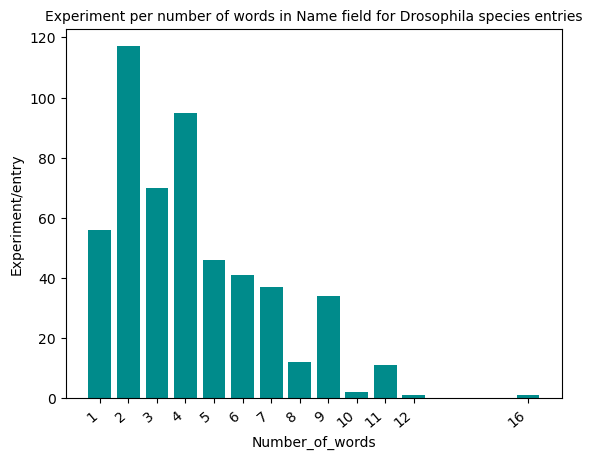

In [84]:
plt.bar(df_number_words_name_drosophila['number_of_words'], df_number_words_name_drosophila['count'], color = "darkcyan")
plt.title("Experiment per number of words in Name field for Drosophila species entries", fontsize = 10)
plt.xlabel("Number_of_words", fontsize = 10)
plt.xticks(df_number_words_name_drosophila['number_of_words'], fontsize = 10, rotation = 40, ha = "right")

plt.ylabel("Experiment/entry", fontsize = 10)
plt.tick_params(axis='both', which='major', labelsize = 10)

## Analysis only BioDare2

In [281]:
df_entities_name_bd2

,entity,count
101,testing,578
10,circadian,542
152,data,450
31,test,337
89,experiment,286
...,...,...
3850,inact,1
3849,vw044_w,1
3847,env1_exp13,1
3845,total-per3-dd,1


In [282]:
df_entities_purpose_bd2

,entity,count
4,circadian,3322
27,period,1979
44,clock,1442
132,test,1389
67,data,1374
...,...,...
7470,https://pfam.xfam.org/,1
7469,pfam,1
7466,reviewers,1
7463,clonend,1


In [283]:
df_entities_description_bd2

,entity,count
11,days,1849
116,light,941
20,plants,651
16,circadian,581
51,data,476
...,...,...
4801,hydrogels,1
2072,repoter,1
4803,editor,1
4804,mail,1


In [284]:
df_entities_comments_bd2

,entity,count
0,circadian,345
92,data,263
3,period,201
1,rhythm,187
4,phase,179
...,...,...
2128,mail,1
2127,editor,1
2126,browser,1
2125,interfering,1


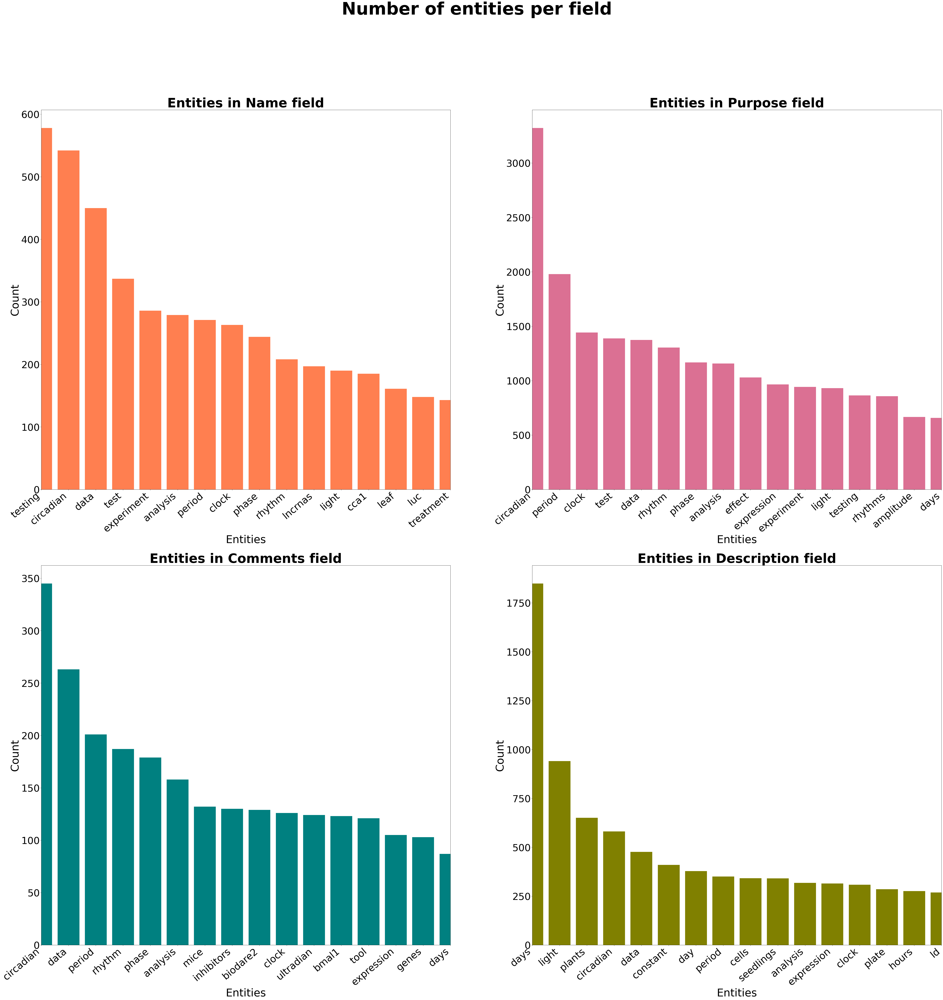

In [579]:
fig, ax = plt.subplots(2,2, figsize = (75,70))

fig.suptitle("Number of entities per field", fontsize = 80, fontweight ='bold')

## Name
ax[0,0].bar(df_entities_name_bd2['entity'], df_entities_name_bd2['count'], color = "coral")
ax[0,0].set_title("Entities in Name field", fontsize = 60, fontweight ='bold')
ax[0,0].set_xlabel("Entities", fontsize = 50)
ax[0,0].set_xticks(df_entities_name_bd2['entity'])
ax[0,0].set_xticklabels(df_entities_name_bd2['entity'],fontsize = 50, rotation = 40, ha = "right")
ax[0,0].set_ylabel("Count", fontsize = 50)
ax[0,0].tick_params(axis='both', which='major', labelsize = 45)
ax[0,0].set_xlim(0,15)
#ax[0,0].set_yscale('log')

## Purpose
ax[0,1].bar(df_entities_purpose_bd2['entity'], df_entities_purpose_bd2['count'], color = "palevioletred")
ax[0,1].set_title("Entities in Purpose field", fontsize = 60, fontweight ='bold')
ax[0,1].set_xlabel("Entities", fontsize = 50)
ax[0,1].set_xticks(df_entities_purpose_bd2['entity'])
ax[0,1].set_xticklabels(df_entities_purpose_bd2['entity'], fontsize = 50, rotation = 40, ha = "right")
ax[0,1].set_ylabel("Count", fontsize = 50)
ax[0,1].tick_params(axis='both', which='major', labelsize = 45)
ax[0,1].set_xlim(0,15)
#ax[0,1].set_yscale('log')


## Comments
ax[1,0].bar(df_entities_comments_bd2['entity'], df_entities_comments_bd2['count'], color = "teal")
ax[1,0].set_title("Entities in Comments field", fontsize = 60, fontweight ='bold')
ax[1,0].set_xlabel("Entities", fontsize = 50)
ax[1,0].set_xticks(df_entities_comments_bd2['entity'])
ax[1,0].set_xticklabels(df_entities_comments_bd2['entity'], fontsize = 50, rotation = 40, ha = "right")
ax[1,0].set_ylabel("Count", fontsize = 50)
ax[1,0].tick_params(axis='both', which='major', labelsize = 45)
ax[1,0].set_xlim(0,15)
#ax[1,0].set_yscale('log')


## Description
ax[1,1].bar(df_entities_description_bd2['entity'], df_entities_description_bd2['count'], color = "olive")
ax[1,1].set_title("Entities in Description field", fontsize = 60, fontweight ='bold')
ax[1,1].set_xlabel("Entities", fontsize = 50)
ax[1,1].set_xticks(df_entities_description_bd2['entity'])
ax[1,1].set_xticklabels(df_entities_description_bd2['entity'], fontsize = 50, rotation = 40, ha = "right")
ax[1,1].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[1,1].set_ylabel("Count", fontsize = 50)
ax[1,1].tick_params(axis='both', which='major', labelsize = 45)
ax[1,1].set_xlim(0,15)
#ax[1,1].set_yscale('log')

plt.savefig('path')


### Number of words

##### Name

In [305]:
df_number_words_name_bd2 = df_all_elements_in_field(list_biodare_2,"name_count_words", "number_of_words", 0)
df_number_words_name_bd2

,number_of_words,count
0,1,3832
1,4,2022
6,3,2021
5,2,1862
2,5,1500
4,6,1127
12,7,863
3,8,573
7,9,438
8,10,292


##### Purpose

In [376]:
df_number_words_purpose_bd2 = df_all_elements_in_field(list_biodare_2,"purpose_count_words", "number_of_words", 0)
df_number_words_purpose_bd2

,number_of_words,count
1,11,1843
7,10,1825
5,12,1588
3,13,1399
4,9,1272
...,...,...
68,177,1
141,197,1
47,410,1
145,202,1


##### Comments

In [307]:
df_number_words_comments_bd2 = df_all_elements_in_field(list_biodare_2,"comments_count_words", "number_of_words", 0)
df_number_words_comments_bd2

,number_of_words,count
0,0,13813
27,1,226
1,10,164
14,8,139
12,12,61
...,...,...
101,174,1
102,222,1
104,46,1
105,87,1


##### Description

In [308]:
df_number_words_description_bd2 = df_all_elements_in_field(list_biodare_2,"description_count_words", "number_of_words", 0)
df_number_words_description_bd2

,number_of_words,count
0,0,10175
8,10,294
7,8,246
13,13,244
27,11,204
...,...,...
146,277,1
147,176,1
148,158,1
98,150,1


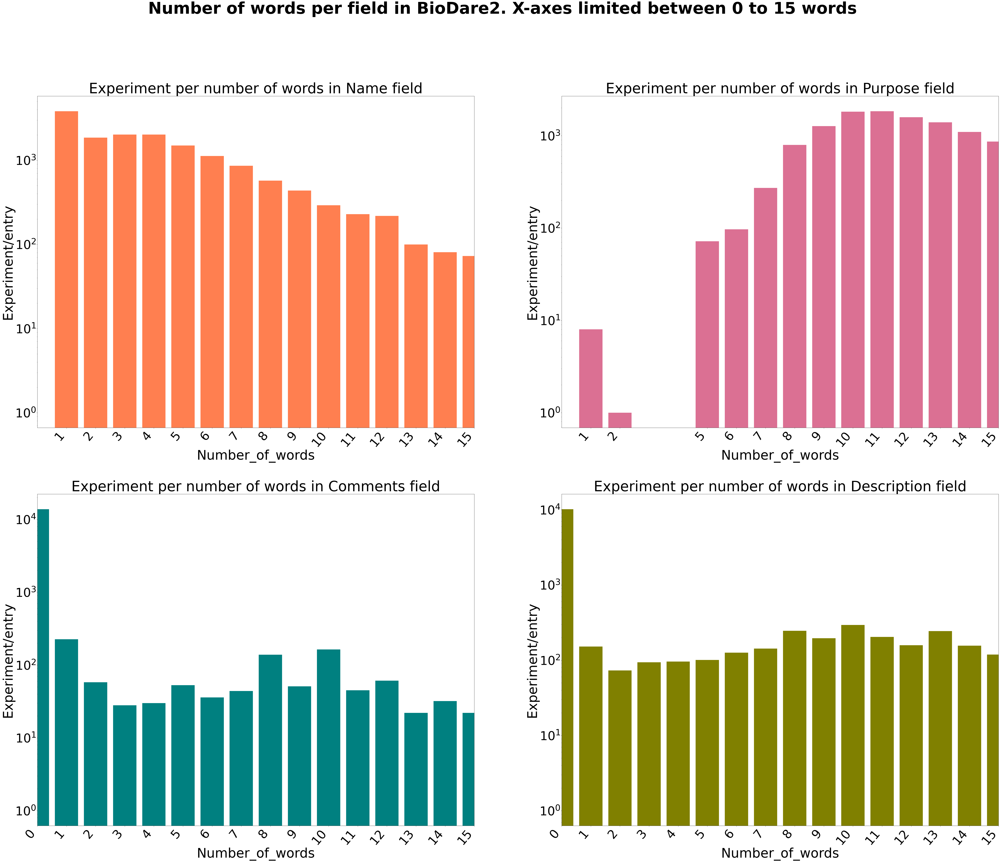

In [578]:
fig, ax = plt.subplots(2,2, figsize = (85,65))

fig.suptitle("Number of words per field in BioDare2. X-axes limited between 0 to 15 words", fontsize = 80, fontweight ='bold')

## Name
ax[0,0].bar(df_number_words_name_bd2['number_of_words'], df_number_words_name_bd2['count'], color = "coral")
ax[0,0].set_title("Experiment per number of words in Name field", fontsize = 70)
ax[0,0].set_xlabel("Number_of_words", fontsize = 65)
ax[0,0].set_xticks(df_number_words_name_bd2['number_of_words'])
ax[0,0].set_xticklabels(df_number_words_name_bd2['number_of_words'],fontsize = 60, rotation = 50, ha = "right")
ax[0,0].set_ylabel("Experiment/entry", fontsize = 65)
ax[0,0].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[0,0].set_yscale('log')
ax[0,0].set_xlim(0,15)
ax[0,0].tick_params(axis='both', which='major', labelsize = 60)

## Purpose
ax[0,1].bar(df_number_words_purpose_bd2['number_of_words'], df_number_words_purpose_bd2['count'], color = "palevioletred")
ax[0,1].set_title("Experiment per number of words in Purpose field", fontsize = 70)
ax[0,1].set_xlabel("Number_of_words", fontsize = 65)
ax[0,1].set_xticks(df_number_words_purpose_bd2['number_of_words'])
ax[0,1].set_xticklabels(df_number_words_purpose_bd2['number_of_words'], fontsize = 60, rotation = 50, ha = "right")
ax[0,1].set_ylabel("Experiment/entry", fontsize = 65)
ax[0,1].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[0,1].set_yscale('log')
ax[0,1].set_xlim(0,15)
ax[0,1].tick_params(axis='both', which='major', labelsize = 60)


## Comments
ax[1,0].bar(df_number_words_comments_bd2['number_of_words'], df_number_words_comments_bd2['count'], color = "teal")
ax[1,0].set_title("Experiment per number of words in Comments field", fontsize = 70)
ax[1,0].set_xlabel("Number_of_words", fontsize = 65)
ax[1,0].set_xticks(df_number_words_comments_bd2['number_of_words'])
ax[1,0].set_xticklabels(df_number_words_comments_bd2['number_of_words'], fontsize = 60, rotation = 50, ha = "right")
ax[1,0].set_ylabel("Experiment/entry", fontsize = 65)
ax[1,0].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[1,0].set_yscale('log')
ax[1,0].set_xlim(0,15)
ax[1,0].tick_params(axis='both', which='major', labelsize = 60)


## Description
ax[1,1].bar(df_number_words_description_bd2['number_of_words'], df_number_words_description_bd2['count'], color = "olive")
ax[1,1].set_title("Experiment per number of words in Description field", fontsize = 70)
ax[1,1].set_xlabel("Number_of_words", fontsize = 65)
ax[1,1].set_xticks(df_number_words_description_bd2['number_of_words'])
ax[1,1].set_xticklabels(df_number_words_description_bd2['number_of_words'], fontsize = 60, rotation = 50, ha = "right")
ax[1,1].get_yaxis().set_major_formatter(plt.ScalarFormatter())
ax[1,1].set_ylabel("Experiment/entry", fontsize = 65)
ax[1,1].set_yscale('log')
ax[1,1].set_xlim(0,15)
ax[1,1].tick_params(axis='both', which='major', labelsize = 60)

plt.savefig('path')


In [421]:
list_df_less_5_words = []
list_df_less_10_words = []
list_df_2_words = []
list_df_1_word = []
count = 0
while count < len(list_biodare_2):
    wk_df = list_biodare_2[count]
    variable = wk_df["purpose_count_words"][0]
    
    if variable == 5:
        list_df_less_5_words.append(wk_df)
        
    elif 6 == variable <= 10:
        list_df_less_10_words.append(wk_df)
        
    elif variable == 2:
        list_df_2_words.append(wk_df)
        
    elif variable == 1:
        list_df_1_word.append(wk_df)
    
    count += 1
    

In [422]:
len(list_df_less_10_words)

97

In [423]:
list_df_less_10_words[0]["purpose_count_words"]

0    6
Name: purpose_count_words, dtype: int64

In [424]:
len(list_df_less_5_words)

72

In [425]:
list_df_less_5_words[0]["purpose_count_words"]

0    5
Name: purpose_count_words, dtype: int64

In [426]:
len(list_df_2_words)

1

In [433]:
list_df_2_words[0]

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,control,global search,,null\ngrowth conditions:\nll24; const. 25.0c w...,,,Felipe,Munoz,Pontificia Universidad Católica de Chile,Pontificia Universidad Católica de Chile,...,"[(global, search)]",0,0,[],16,106,"[(null, \n), (growth, conditions), (ll24), (ex...",2,17,[(Neurospora)]
1,,,,,,,Luis,Larrondo,,,...,"[(global, search)]",0,0,[],16,106,"[(null, \n), (growth, conditions), (ll24), (ex...",2,17,[(Neurospora)]


In [427]:
len(list_df_1_word)

8

In [430]:
list_df_1_word[0].columns

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,def dd,xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx...,,,1042,charles_darwin,Romario,Melo,ULB,ULB,...,[],0,0,[],0,0,[],2,20,"[(Arabidopsis, thaliana)]"


In [429]:
list_df_1_word[0]["id_experiment"]

0    10674
Name: id_experiment, dtype: int64

In [431]:
list_df_1_word[1]

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,def dd 01,xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx...,,,1042,charles_darwin,Romario,Melo,ULB,ULB,...,[(xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx...,0,0,[],0,0,[],2,20,"[(Arabidopsis, thaliana)]"


In [437]:
list_df_1_word[1]["id_experiment"]

0    10710
Name: id_experiment, dtype: int64

### Analysis removing special characters

In [442]:
def remove_special_characters(df):
    
    no_special_characters = df.replace(r'[^A-Za-z0-9 ]+', '', regex=True)
    return no_special_characters

In [445]:
remove_special_characters(test)

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,recropformalexp1stsyst1,to analyze the motion of arabidopsis to check ...,,,3009,sherrysclock,NiChiao,Tsai,National Taiwan University,National Taiwan University,...,"[(analyze), (motion), (arabidopsis), (check), ...",0,0,[],0,0,[],2,20,"[(Arabidopsis, thaliana)]"


### New_df without special characters

In [464]:
new_list = []
df_new = pd.DataFrame()
count = 0

while count < len(list_biodare_2):
    wk_df = list_biodare_2[count]
    df_new = remove_special_characters(wk_df)
    new_list.append(df_new)
    
    count += 1

In [459]:
test = list_biodare_2[0]

In [460]:
remove_special_characters(test)

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,recropformalexp1stsyst1,to analyze the motion of arabidopsis to check ...,,,3009,sherrysclock,NiChiao,Tsai,National Taiwan University,National Taiwan University,...,"[(analyze), (motion), (arabidopsis), (check), ...",0,0,[],0,0,[],2,20,"[(Arabidopsis, thaliana)]"


In [485]:
new_list[2]

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,10012018 gst3luc in ppp1,first time to run gst3luc in wt and cross prog...,result is really weird,,1324,dzhaolan,Zhaolan,Ding,TAMU,TAMU,...,"[(gst3-luc), (cross, progenies), (ppp1, cross,...",4,25,[],0,0,[],2,17,[(Neurospora)]


## Without stopping words

In [446]:
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
 
nltk.download('stopwords')
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/s2531396/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [472]:
def remove_stopwords(text):
    # Tokenize the text into words
    words = nltk.word_tokenize(text)
    
    # Get the list of English stop words
    stop_words = set(stopwords.words('english'))
    
    # Remove stop words from the tokenized words
    filtered_words = [word for word in words if word.lower() not in stop_words]
    
    # Join the filtered words back into a single string
    filtered_text = ' '.join(filtered_words)
    
    return filtered_text

In [470]:
remove_stopwords(new_list[2]["purpose"][0])

'first time run gst3luc wt cross progenies ppp1 cross gst3luc'

In [471]:
new_list[2]["purpose"][0]

'first time to run gst3luc in wt and cross progenies of ppp1 cross gst3luc'

In [486]:
def df_wo_stopping_words(df,header):
    count = 0 
    #list_wo_stop_words = []
    
    while count < len(df):
        wk_df = df[count]
        for header in headers:
            text_to_change = wk_df[header][0]
            new_text = remove_stopwords(text_to_change)
            wk_df.at[0,header] = new_text
        
        count += 1
    
    return df

In [487]:
test = df_wo_stopping_words(list_biodare_2, headers)

In [488]:
test[0]

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,re-crop_formalexp-1st_syst-1,analyze motion arabidopsis check circadian rhy...,,,3009,sherrysclock,NiChiao,Tsai,National Taiwan University,National Taiwan University,...,"[(analyze), (motion), (arabidopsis), (check), ...",0,0,[],0,0,[],2,20,"[(Arabidopsis, thaliana)]"


In [489]:
list_biodare_2[0]

,name,purpose,description,comments,id,login,firstName,lastName,institution_name,logName,...,purpose_entities_recognised,description_count_words,description_count_characters,description_entities_recognised,comments_count_words,comments_count_characters,comments_entities_recognised,species_count_words,species_count_characters,species_entities_recognised
0,re-crop_formalexp-1st_syst-1,analyze motion arabidopsis check circadian rhy...,,,3009,sherrysclock,NiChiao,Tsai,National Taiwan University,National Taiwan University,...,"[(analyze), (motion), (arabidopsis), (check), ...",0,0,[],0,0,[],2,20,"[(Arabidopsis, thaliana)]"


In [553]:
while count < len(list_biodare_2):
    title = ''
    wk_df = list_biodare_2[count]
    value_to_add = 0
    list_to_add = []
    
    for header in list_headers:
        element = wk_df[header][0]
        #print(element)
        # Words count
        value_to_add = count_words(element)
        title = header + "_count_words"
        wk_df[title] = value_to_add
            
            
        # Character count
        value_to_add = count_characters(element)
        title = header + "_count_characters"
        wk_df[title] = value_to_add
            
    
        # Entities recognition  
        list_to_add = entities_recognition(element)
        title = header + "_entities_recognised"
        #Data_type = str
        wk_df[title] = [list_to_add] * len(wk_df)
        
        
    count += 1

In [554]:
list_biodare_2[9783]["purpose"]

0    many circadian biology community already use f...
Name: purpose, dtype: object

In [555]:
dfs[9783]["purpose"]

0    calculate circadian rhythm blood pressure shif...
Name: purpose, dtype: object

In [556]:
list_biodare_2[50]["purpose"]

0    compare elf4luc rt lumi data ( i+s ) phase per...
Name: purpose, dtype: object

In [557]:
df_number_words_purpose_bd2_test = df_all_elements_in_field(test,"purpose_count_words", "number_of_words", 0)
df_number_words_purpose_bd2_test

,number_of_words,count
1,11,1843
7,10,1825
5,12,1588
3,13,1399
4,9,1272
...,...,...
68,177,1
141,197,1
47,410,1
145,202,1


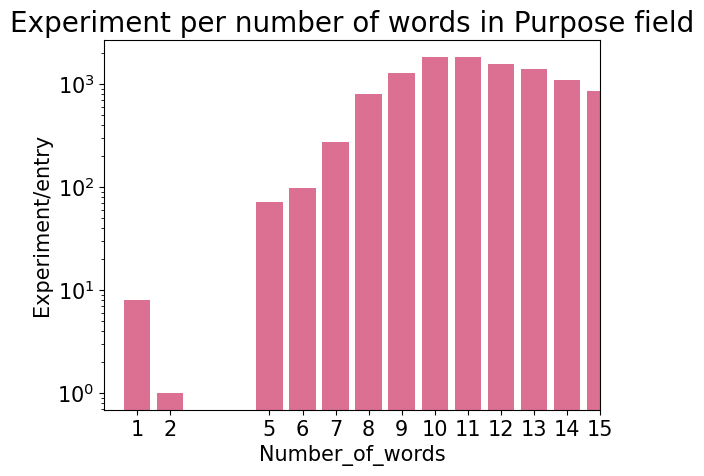

In [558]:
plt.bar(df_number_words_purpose_bd2['number_of_words'], df_number_words_purpose_bd2['count'], color = "palevioletred")
plt.title("Experiment per number of words in Purpose field", fontsize = 20)
plt.xlabel("Number_of_words", fontsize = 15)
plt.xticks(df_number_words_purpose_bd2['number_of_words'])
#plt.xticklabels(df_number_words_purpose_bd2['number_of_words'], fontsize = 15, rotation = 50, ha = "right")
plt.ylabel("Experiment/entry", fontsize = 15)
#plt.yaxis().set_major_formatter(plt.ScalarFormatter())
plt.yscale('log')
plt.xlim(0,15)
plt.tick_params(axis='both', which='major', labelsize = 15)

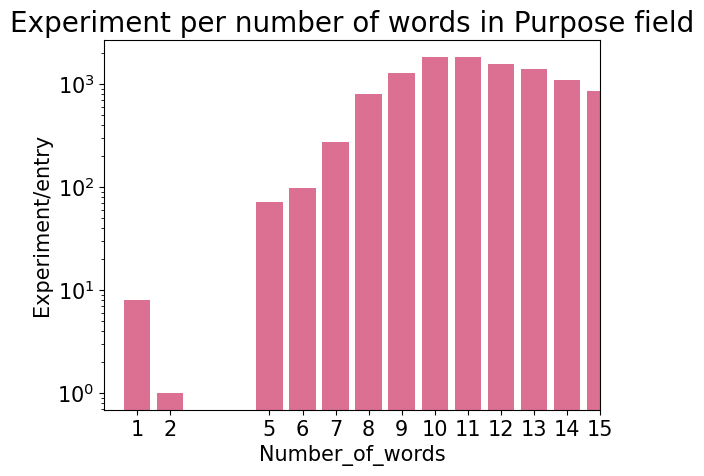

In [559]:
plt.bar(df_number_words_purpose_bd2_test['number_of_words'], df_number_words_purpose_bd2_test['count'], color = "palevioletred")
plt.title("Experiment per number of words in Purpose field", fontsize = 20)
plt.xlabel("Number_of_words", fontsize = 15)
plt.xticks(df_number_words_purpose_bd2_test['number_of_words'])
#plt.xticklabels(df_number_words_purpose_bd2['number_of_words'], fontsize = 15, rotation = 50, ha = "right")
plt.ylabel("Experiment/entry", fontsize = 15)
#plt.yaxis().set_major_formatter(plt.ScalarFormatter())
plt.yscale('log')
plt.xlim(0,15)
plt.tick_params(axis='both', which='major', labelsize = 15)

In [564]:
list_biodare_2[0].columns

Index(['name', 'purpose', 'description', 'comments', 'id', 'login',
       'firstName', 'lastName', 'institution_name', 'logName', 'executionDate',
       'measurementDesc.technique', 'measurementDesc.equipment',
       'measurementDesc.description', 'measurementDesc.parameters',
       'hasAttachments', 'hasTSData', 'hasPPAJobs', 'hasDataFiles',
       'attachmentsSize', 'biodare1Id', 'isOpenAccess', 'hasRhythmicityJobs',
       'dataCategories', 'species', 'created', 'modified', 'modifiedBy',
       'dataCategory', 'id_experiment', 'name_count_words',
       'name_count_characters', 'name_entities_recognised',
       'purpose_count_words', 'purpose_count_characters',
       'purpose_entities_recognised', 'description_count_words',
       'description_count_characters', 'description_entities_recognised',
       'comments_count_words', 'comments_count_characters',
       'comments_entities_recognised', 'species_count_words',
       'species_count_characters', 'species_entities_recognis

In [570]:
list_biodare_2[100].columns

Index(['name', 'purpose', 'description', 'comments', 'id', 'login',
       'firstName', 'lastName', 'institution_name', 'logName', 'executionDate',
       'measurementDesc.technique', 'measurementDesc.equipment',
       'measurementDesc.description', 'measurementDesc.parameters',
       'hasAttachments', 'hasTSData', 'hasPPAJobs', 'hasDataFiles',
       'attachmentsSize', 'dataCategories', 'species', 'created', 'modified',
       'modifiedBy', 'dataCategory', 'id_experiment', 'name_count_words',
       'name_count_characters', 'name_entities_recognised',
       'purpose_count_words', 'purpose_count_characters',
       'purpose_entities_recognised', 'description_count_words',
       'description_count_characters', 'description_entities_recognised',
       'comments_count_words', 'comments_count_characters',
       'comments_entities_recognised', 'species_count_words',
       'species_count_characters', 'species_entities_recognised'],
      dtype='object')